In [1]:
import os
module_path = os.path.abspath(os.path.join('..'))
#ONLY RUN ONCE!
os.chdir(module_path)

In [134]:
from agent_components.demand.data import make_sequences_from_historical, parse_usage_game_log, clear
from util.learning_utils import ModelWriter, TbWriterHelper, get_callbacks_with_generator, get_usage_file_paths
import agent_components.demand.data as data
import numpy as np
import pandas as pd
from notebooks.helpers import *
import random

## Finding a good model
I am trying to find a good model to predict usage data for customers. Therefore, I will try several models and compare their results. 

In [20]:
#basic requirements for doing ML
import keras
from keras.initializers import RandomUniform
from keras.layers import LSTM, Dropout, Activation
from keras.layers.core import Dense
from keras.models import Sequential
from keras.optimizers import Adam
from keras.regularizers import l2
import time
from keras.layers import BatchNormalization
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from keras.preprocessing.sequence import TimeseriesGenerator

import util.config as cfg


In [4]:
game_files = get_usage_file_paths()
f = game_files[0]

In [5]:
from util.learning_utils import get_tb_cb
tb_cb = get_tb_cb('jupyter_dense_v7')

In [6]:
#a generator that is just based on a specific customer class to start with
def get_gen_and_data(preprocessing = 'standard', flatten=False, customer='BrooksideHomes'):
    clear() #clears data
    d, scaler = parse_usage_game_log(f, pp_type=preprocessing)
    customer_data = data.demand_data[customer]
    return data.sequence_for_usages(customer_data, flatten, scaler), customer_data, scaler
    
gen, base_data, scaler = get_gen_and_data()

A utility function to experiment with many different models quickly

In [165]:
def plot_for_model(model, flatten=False, figsize=FIGSIZE):
    bd = base_data[0:500].reshape(-1,1)
    PREDICTIONS = 5
    preds = []
    #getting several predictions
    for i in range(PREDICTIONS):
        start_x = i*30
        end_x = i*30 + cfg.DEMAND_ONE_WEEK
        if flatten:
            x = np.array([bd.flatten()[start_x:end_x]])
        else:
            x = np.array([bd[start_x:end_x].reshape(-1,1)])
        #predict
        y_pred = model.predict(x)
        #reverse scaling
        y_pred = scaler.inverse_transform(y_pred)
        #pad with nan at the beginning to align correctly
        nans_before = np.full((end_x,), np.nan)
        nans_after = np.full((len(bd)-24-end_x), np.nan)
        
        
        y_pred = np.concatenate((nans_before, y_pred.flatten(),nans_after))
        preds.append(y_pred)

    bd_flat = scaler.inverse_transform(bd).flatten()
    
    preds.append(bd_flat)
    df_data = np.array(preds).transpose()
    print(df_data.shape)
    df = pd.DataFrame(df_data)
    df.plot(figsize=figsize)
    return df_data

### LSTM v2: fairly deep, linear output. 

In [7]:
model1 = Sequential()
# input layer
input_shape = (cfg.DEMAND_ONE_WEEK, 1)
model1.add(LSTM(168, input_shape=input_shape, return_sequences=True))
#model.add(Dropout(0.2))
model1.add(LSTM(100, return_sequences=True))
model1.add(LSTM(50, return_sequences=False))
model1.add(Dense(50))
model1.add(Dense(24))
model1.add(Activation('linear'))

start = time.time()
#optimizr = Adam(lr=0.1)
model1.compile(loss='mse', optimizer='adam')

In [8]:
model1.fit_generator(gen, epochs=4)

Epoch 1/4
147/147 [==============================] - 3s 23ms/step - loss: 11.0898
Epoch 2/4
147/147 [==============================] - 2s 16ms/step - loss: 6.2781
Epoch 3/4
147/147 [==============================] - 2s 16ms/step - loss: 6.2686
Epoch 4/4
147/147 [==============================] - 2s 16ms/step - loss: 6.3208


In [18]:
df_d = plot_for_model(model1)

(500, 6)


Okay, so that is not very cool. It seems to always predict very much a similar result. Let's see what effects the preprocessing and the network stuctures have.

In [10]:
gen, base_data, scaler = get_gen_and_data(preprocessing='minmax')
model1.compile(loss='mse', optimizer='adam')
model1.fit_generator(gen, epochs=4)
df_d = plot_for_model(model1)

Epoch 1/4
147/147 [==============================] - 3s 18ms/step - loss: 0.0096
Epoch 2/4
147/147 [==============================] - 2s 16ms/step - loss: 0.0075
Epoch 3/4
147/147 [==============================] - 2s 16ms/step - loss: 0.0077
Epoch 4/4
147/147 [==============================] - 2s 16ms/step - loss: 0.0075
(500, 6)


Trying with different model structures

In [11]:
model = Sequential()
# input layer
input_shape = (cfg.DEMAND_ONE_WEEK, 1)
model.add(LSTM(168, input_shape=input_shape, return_sequences=False))
model.add(Dense(24))
model.add(Activation('linear'))

model.compile(loss='mse', optimizer='SGD')

model.fit_generator(gen, epochs=6)

Epoch 1/6
147/147 [==============================] - 1s 7ms/step - loss: 0.1010
Epoch 2/6
147/147 [==============================] - 1s 7ms/step - loss: 0.0266
Epoch 3/6
147/147 [==============================] - 1s 7ms/step - loss: 0.0090
Epoch 4/6
147/147 [==============================] - 1s 6ms/step - loss: 0.0069
Epoch 5/6
147/147 [==============================] - 1s 6ms/step - loss: 0.0067
Epoch 6/6
147/147 [==============================] - 1s 6ms/step - loss: 0.0067


In [12]:
df_d = plot_for_model(model)

(500, 6)


okay that's just flat. 

Okay, let's try a different type. Dense only, without LSTM / Memory. Flatten the input

In [24]:
gen, base_data, scaler = get_gen_and_data(preprocessing='minmax', flatten=True)

model2 = Sequential()
# input layer
input_shape = (cfg.DEMAND_ONE_WEEK,)
model2.add(Dense(168, input_shape=input_shape, activation='relu'))
model2.add(Dense(100, activation='relu'))
model2.add(Dense(50, activation='relu'))
model2.add(Dense(24))
model2.add(Activation('linear'))

model2.compile(loss='mse', optimizer='adam')

model2.fit_generator(gen, epochs=20)

Epoch 1/20
147/147 [==============================] - 1s 5ms/step - loss: 0.0173
Epoch 2/20
147/147 [==============================] - 0s 3ms/step - loss: 0.0083
Epoch 3/20
147/147 [==============================] - 0s 3ms/step - loss: 0.0072
Epoch 4/20
147/147 [==============================] - 0s 3ms/step - loss: 0.0072
Epoch 5/20
147/147 [==============================] - 0s 3ms/step - loss: 0.0073
Epoch 6/20
147/147 [==============================] - 0s 3ms/step - loss: 0.0066
Epoch 7/20
147/147 [==============================] - 0s 3ms/step - loss: 0.0065
Epoch 8/20
147/147 [==============================] - 0s 3ms/step - loss: 0.0064
Epoch 9/20
147/147 [==============================] - 0s 3ms/step - loss: 0.0062
Epoch 10/20
147/147 [==============================] - 0s 3ms/step - loss: 0.0057
Epoch 11/20
147/147 [==============================] - 0s 3ms/step - loss: 0.0064
Epoch 12/20
147/147 [==============================] - 0s 3ms/step - loss: 0.0063
Epoch 13/20
147/147 [====

In [25]:
df_d = plot_for_model(model2, flatten=True)

(500, 6)


### Trying for a different customer

In [28]:
print('Dense Vanilla based')
gen, base_data, scaler = get_gen_and_data(customer='EastsideOffices', flatten=True)
model2.compile(loss='mse', optimizer='adam')
model2.fit_generator(gen, epochs=10)
print('LSTM based')
gen, base_data, scaler = get_gen_and_data(customer='EastsideOffices', flatten=False)
model1.compile(loss='mse', optimizer='adam')
model1.fit_generator(gen, epochs=4)

Dense Vanilla based
Epoch 1/10
147/147 [==============================] - 1s 5ms/step - loss: 0.1583
Epoch 2/10
147/147 [==============================] - 0s 3ms/step - loss: 0.1488
Epoch 3/10
147/147 [==============================] - 0s 3ms/step - loss: 0.1537
Epoch 4/10
147/147 [==============================] - 0s 3ms/step - loss: 0.1507
Epoch 5/10
147/147 [==============================] - 0s 3ms/step - loss: 0.1502
Epoch 6/10
147/147 [==============================] - 0s 3ms/step - loss: 0.1410
Epoch 7/10
147/147 [==============================] - 0s 3ms/step - loss: 0.1372
Epoch 8/10
147/147 [==============================] - 0s 3ms/step - loss: 0.1366
Epoch 9/10
147/147 [==============================] - 0s 3ms/step - loss: 0.1397
Epoch 10/10
147/147 [==============================] - 0s 3ms/step - loss: 0.1198
LSTM based
Epoch 1/4
147/147 [==============================] - 3s 21ms/step - loss: 1.1157
Epoch 2/4
147/147 [==============================] - 2s 16ms/step - loss: 1.1

In [27]:
df_d = plot_for_model(model2, flatten=True)
df_d = plot_for_model(model1, flatten=False)

(500, 6)
(500, 6)


Okay, looking good with:
- standard scaler
- dense
- SGD
- mse
- relu
- linear in output layer

Trying again with hard customer group

In [19]:
gen, base_data, scaler = get_gen_and_data(flatten=True)

model3 = Sequential()
# input layer
input_shape = (cfg.DEMAND_ONE_WEEK,)
model3.add(Dense(168, input_shape=input_shape, activation='relu'))
model3.add(Dense(100, activation='relu'))
model3.add(Dense(100, activation='relu'))
model3.add(Dense(50, activation='relu'))
model3.add(Dense(50, activation='relu'))
model3.add(Dense(24))
model3.add(Activation('linear'))

model3.compile(loss='mse', optimizer='rmsprop')

model3.fit_generator(gen, epochs=20)

df_d = plot_for_model(model3, flatten=True)


Epoch 1/20
147/147 [==============================] - 1s 3ms/step - loss: 8.2080
Epoch 2/20
147/147 [==============================] - 0s 3ms/step - loss: 5.6846
Epoch 3/20
147/147 [==============================] - 0s 3ms/step - loss: 5.0318
Epoch 4/20
147/147 [==============================] - 0s 3ms/step - loss: 4.7393
Epoch 5/20
147/147 [==============================] - 0s 3ms/step - loss: 4.5103
Epoch 6/20
147/147 [==============================] - 0s 3ms/step - loss: 4.1276
Epoch 7/20
147/147 [==============================] - 0s 3ms/step - loss: 4.0775
Epoch 8/20
147/147 [==============================] - 0s 3ms/step - loss: 3.8119
Epoch 9/20
147/147 [==============================] - 0s 3ms/step - loss: 3.6551
Epoch 10/20
147/147 [==============================] - 0s 3ms/step - loss: 3.5440
Epoch 11/20
147/147 [==============================] - 0s 3ms/step - loss: 3.4278
Epoch 12/20
147/147 [==============================] - 0s 3ms/step - loss: 3.3301
Epoch 13/20
147/147 [====

And applying this to the very systematic offices:

In [20]:
gen, base_data, scaler = get_gen_and_data(customer='EastsideOffices', flatten=True)
model3.fit_generator(gen, epochs=20)

Epoch 1/20
147/147 [==============================] - 0s 2ms/step - loss: 0.4015
Epoch 2/20
147/147 [==============================] - 0s 3ms/step - loss: 0.2608
Epoch 3/20
147/147 [==============================] - 0s 3ms/step - loss: 0.2209
Epoch 4/20
147/147 [==============================] - 0s 3ms/step - loss: 0.1866
Epoch 5/20
147/147 [==============================] - 0s 3ms/step - loss: 0.1845
Epoch 6/20
147/147 [==============================] - 0s 3ms/step - loss: 0.1750
Epoch 7/20
147/147 [==============================] - 0s 3ms/step - loss: 0.1722
Epoch 8/20
147/147 [==============================] - 0s 3ms/step - loss: 0.1691
Epoch 9/20
147/147 [==============================] - 0s 3ms/step - loss: 0.1597
Epoch 10/20
147/147 [==============================] - 0s 3ms/step - loss: 0.1693
Epoch 11/20
147/147 [==============================] - 0s 3ms/step - loss: 0.1621
Epoch 12/20
147/147 [==============================] - 0s 3ms/step - loss: 0.1469
Epoch 13/20
147/147 [====

In [21]:
df_d = plot_for_model(model3, flatten=True)


(500, 6)


### Single hard customer prediction with best model (model3)

Epoch 1/20
147/147 [==============================] - 0s 2ms/step - loss: 0.0428
Epoch 2/20
147/147 [==============================] - 0s 3ms/step - loss: 7.0300e-04
Epoch 3/20
147/147 [==============================] - 0s 3ms/step - loss: 5.7538e-04
Epoch 4/20
147/147 [==============================] - 0s 3ms/step - loss: 5.0173e-04
Epoch 5/20
147/147 [==============================] - 0s 3ms/step - loss: 4.7742e-04
Epoch 6/20
147/147 [==============================] - 0s 3ms/step - loss: 3.8697e-04
Epoch 7/20
147/147 [==============================] - 0s 3ms/step - loss: 3.9085e-04
Epoch 8/20
147/147 [==============================] - 0s 3ms/step - loss: 3.6123e-04
Epoch 9/20
147/147 [==============================] - 0s 3ms/step - loss: 3.2737e-04
Epoch 10/20
147/147 [==============================] - 0s 3ms/step - loss: 3.0583e-04
Epoch 11/20
147/147 [==============================] - 0s 3ms/step - loss: 2.8918e-04
Epoch 12/20
147/147 [==============================] - 0s 3ms/step 

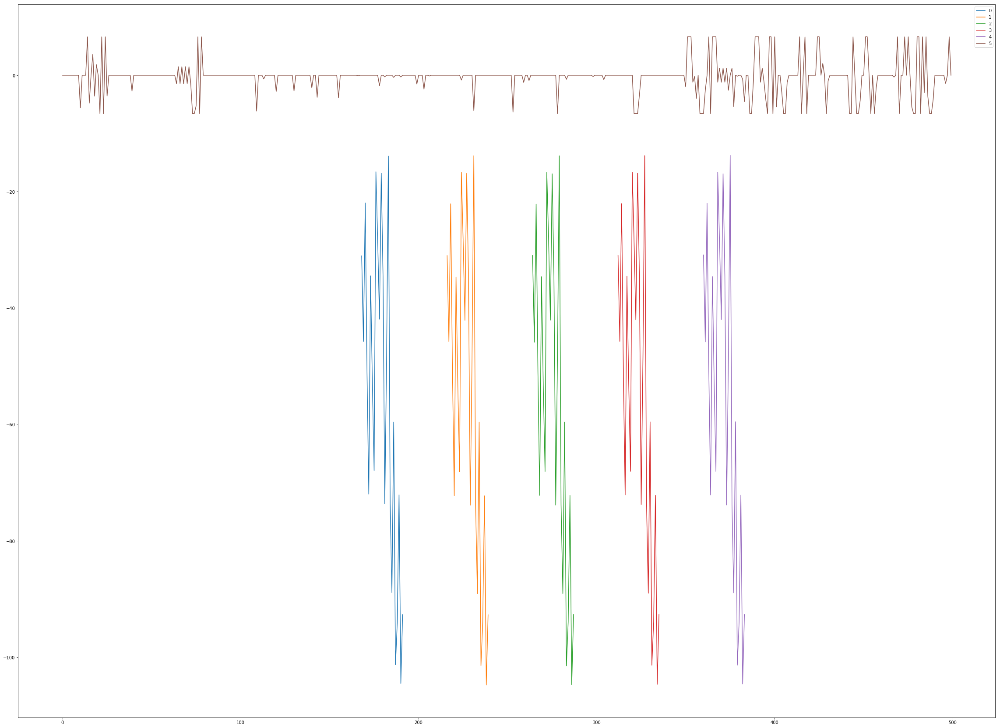

In [22]:
gen, base_data, scaler = get_gen_and_data(customer='MiddleIncome-3_15', flatten=True)
model3.fit_generator(gen, epochs=20)
df_d = plot_for_model(model3, flatten=True)

Doing really bad. What if the model is fresh?

In [23]:
model4 = Sequential()
# input layer
input_shape = (cfg.DEMAND_ONE_WEEK,)
model4.add(Dense(168, input_shape=input_shape, activation='relu'))
model4.add(Dense(100, activation='relu'))
model4.add(Dense(100, activation='relu'))
model4.add(Dense(50, activation='relu'))
model4.add(Dense(50, activation='relu'))
model4.add(Dense(24))
model4.add(Activation('linear'))
model4.compile(loss='mse', optimizer='rmsprop')

gen, base_data, scaler = get_gen_and_data(preprocessing='none', customer='MiddleIncome-3_15', flatten=True)
model4.fit_generator(gen, epochs=30)
df_d = plot_for_model(model4, flatten=True)



Epoch 1/30
147/147 [==============================] - 1s 4ms/step - loss: 8.5614
Epoch 2/30
147/147 [==============================] - 0s 3ms/step - loss: 8.3522
Epoch 3/30
147/147 [==============================] - 0s 3ms/step - loss: 8.0842
Epoch 4/30
147/147 [==============================] - 0s 3ms/step - loss: 7.7097
Epoch 5/30
147/147 [==============================] - 0s 3ms/step - loss: 7.3288
Epoch 6/30
147/147 [==============================] - 0s 3ms/step - loss: 6.9194
Epoch 7/30
147/147 [==============================] - 0s 3ms/step - loss: 6.5698
Epoch 8/30
147/147 [==============================] - 0s 3ms/step - loss: 6.2462
Epoch 9/30
147/147 [==============================] - 0s 3ms/step - loss: 5.9614
Epoch 10/30
147/147 [==============================] - 0s 3ms/step - loss: 5.6481
Epoch 11/30
147/147 [==============================] - 0s 3ms/step - loss: 5.3941
Epoch 12/30
147/147 [==============================] - 0s 3ms/step - loss: 5.1799
Epoch 13/30
147/147 [====

Okay. This is obviously a problem! The network is having big troubles getting both huge customers and very small customers to be predicted well. The StandardScaler/MinMax Scaler both cannot really handle both large and small customers together.

2 Alternatives:
1. unique model for different customer classes (extrma would be a unique model for each customer)
2. somehow normalize the data more adequately (maybe inside the model)

Epoch 1/30
147/147 [==============================] - 1s 5ms/step - loss: 7.1672e-04
Epoch 2/30
147/147 [==============================] - 0s 3ms/step - loss: 2.0915e-04
Epoch 3/30
147/147 [==============================] - 1s 3ms/step - loss: 1.8118e-04
Epoch 4/30
147/147 [==============================] - 0s 3ms/step - loss: 1.5922e-04
Epoch 5/30
147/147 [==============================] - 0s 3ms/step - loss: 1.4977e-04
Epoch 6/30
147/147 [==============================] - 0s 3ms/step - loss: 1.4239e-04
Epoch 7/30
147/147 [==============================] - 0s 3ms/step - loss: 1.4073e-04
Epoch 8/30
147/147 [==============================] - 1s 4ms/step - loss: 1.2955e-04
Epoch 9/30
147/147 [==============================] - 1s 4ms/step - loss: 1.2434e-04
Epoch 10/30
147/147 [==============================] - 1s 3ms/step - loss: 1.1328e-04
Epoch 11/30
147/147 [==============================] - 0s 3ms/step - loss: 1.0419e-04
Epoch 12/30
147/147 [==============================] - 0s 3ms/s

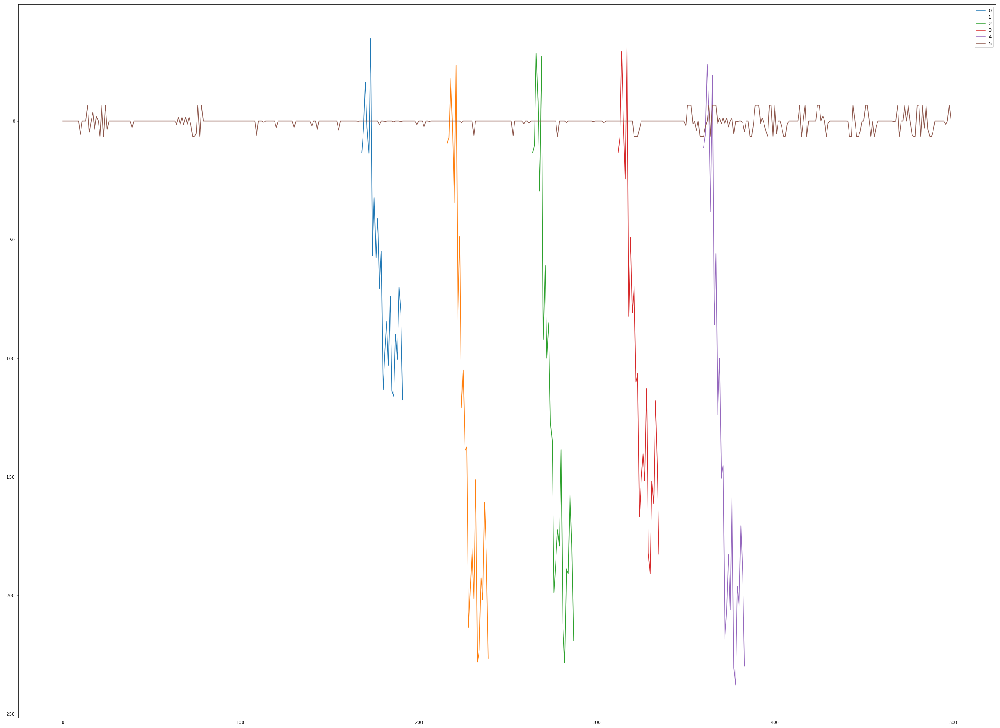

In [17]:
from keras.layers import BatchNormalization

model5 = Sequential()
# input layer
input_shape = (cfg.DEMAND_ONE_WEEK,)
model5.add(Dense(168, input_shape=input_shape, activation='relu'))
model5.add(BatchNormalization()) #applying batch normalization now
model5.add(Dense(100, activation='relu'))
model5.add(Dense(100, activation='relu'))
model5.add(Dense(50, activation='relu'))
model5.add(Dense(50, activation='relu'))
model5.add(Dense(24))
model5.add(Activation('linear'))
model5.compile(loss='mse', optimizer='rmsprop')

gen, base_data, scaler = get_gen_and_data(preprocessing='standard', customer='MiddleIncome-3_15', flatten=True)
model5.fit_generator(gen, epochs=30)
df_d = plot_for_model(model5, flatten=True)

In [18]:
gen, base_data, scaler = get_gen_and_data(preprocessing='standard', flatten=True)
model5.fit_generator(gen, epochs=30)
df_d = plot_for_model(model5, flatten=True)

Epoch 1/30
147/147 [==============================] - 0s 3ms/step - loss: 8.9477
Epoch 2/30
147/147 [==============================] - 1s 4ms/step - loss: 4.6675
Epoch 3/30
147/147 [==============================] - 1s 4ms/step - loss: 3.8679
Epoch 4/30
147/147 [==============================] - 0s 3ms/step - loss: 3.3656
Epoch 5/30
147/147 [==============================] - 1s 4ms/step - loss: 2.9579
Epoch 6/30
147/147 [==============================] - 1s 5ms/step - loss: 2.7343
Epoch 7/30
147/147 [==============================] - 0s 3ms/step - loss: 2.5054
Epoch 8/30
147/147 [==============================] - 0s 3ms/step - loss: 2.3043
Epoch 9/30
147/147 [==============================] - 0s 3ms/step - loss: 2.2150
Epoch 10/30
147/147 [==============================] - 0s 3ms/step - loss: 2.0729
Epoch 11/30
147/147 [==============================] - 1s 4ms/step - loss: 1.9395
Epoch 12/30
147/147 [==============================] - 1s 6ms/step - loss: 1.8859
Epoch 13/30
147/147 [====

Normalization alone doesn't seem to be doing anything helpful. Let's try a different scaler, the RobustScaler which is robust against outliers while still being linear

In [25]:
from keras.layers import BatchNormalization

model6 = Sequential()
# input layer
input_shape = (cfg.DEMAND_ONE_WEEK,)
model6.add(Dense(168, input_shape=input_shape, activation='relu'))
model6.add(BatchNormalization())
model6.add(Dense(100, activation='relu'))
model6.add(Dense(100, activation='relu'))
model6.add(Dense(50, activation='relu'))
model6.add(Dense(50, activation='relu'))
model6.add(Dense(24))
model6.add(Activation('linear'))
model6.compile(loss='mse', optimizer='rmsprop')



In [27]:
gen, base_data, scaler = get_gen_and_data(preprocessing="robust", customer='MiddleIncome-3_15', flatten=True)
model6.fit_generator(gen, epochs=30)

Epoch 1/30
147/147 [==============================] - 0s 3ms/step - loss: 0.6277
Epoch 2/30
147/147 [==============================] - 0s 3ms/step - loss: 0.5889
Epoch 3/30
147/147 [==============================] - 1s 3ms/step - loss: 0.5544
Epoch 4/30
147/147 [==============================] - 1s 4ms/step - loss: 0.5213
Epoch 5/30
147/147 [==============================] - 1s 3ms/step - loss: 0.4946
Epoch 6/30
147/147 [==============================] - 0s 3ms/step - loss: 0.4691
Epoch 7/30
147/147 [==============================] - 0s 3ms/step - loss: 0.4461
Epoch 8/30
147/147 [==============================] - 1s 3ms/step - loss: 0.4286
Epoch 9/30
147/147 [==============================] - 1s 4ms/step - loss: 0.4084
Epoch 10/30
147/147 [==============================] - 1s 4ms/step - loss: 0.3923
Epoch 11/30
147/147 [==============================] - 0s 3ms/step - loss: 0.3791
Epoch 12/30
147/147 [==============================] - 0s 3ms/step - loss: 0.3647
Epoch 13/30
147/147 [====

In [28]:
df_d = plot_for_model(model6, flatten=True)

(500, 6)


In [29]:
gen, base_data, scaler = get_gen_and_data(preprocessing="robust", flatten=True)
model6.fit_generator(gen, epochs=30)


Epoch 1/30
147/147 [==============================] - 0s 3ms/step - loss: 11862609.8727
Epoch 2/30
147/147 [==============================] - 1s 3ms/step - loss: 3927868.8231
Epoch 3/30
147/147 [==============================] - 0s 3ms/step - loss: 3829851.0047
Epoch 4/30
147/147 [==============================] - 1s 4ms/step - loss: 3759782.8239
Epoch 5/30
147/147 [==============================] - 0s 3ms/step - loss: 3747490.4037
Epoch 6/30
147/147 [==============================] - 0s 3ms/step - loss: 3683569.4672
Epoch 7/30
147/147 [==============================] - 0s 3ms/step - loss: 3627751.6393
Epoch 8/30
147/147 [==============================] - 1s 4ms/step - loss: 3512642.8080
Epoch 9/30
147/147 [==============================] - 0s 3ms/step - loss: 3451198.1969
Epoch 10/30
147/147 [==============================] - 0s 3ms/step - loss: 3249628.8872
Epoch 11/30
147/147 [==============================] - 0s 3ms/step - loss: 3086995.1785
Epoch 12/30
147/147 [===================

In [30]:
df_d = plot_for_model(model6, flatten=True)

(500, 6)


Epoch 1/20
147/147 [==============================] - 0s 3ms/step - loss: 825410.0554
Epoch 2/20
147/147 [==============================] - 0s 3ms/step - loss: 648133.5902
Epoch 3/20
147/147 [==============================] - 1s 4ms/step - loss: 572197.3666
Epoch 4/20
147/147 [==============================] - 1s 4ms/step - loss: 468802.8200
Epoch 5/20
147/147 [==============================] - 0s 3ms/step - loss: 323023.5396
Epoch 6/20
147/147 [==============================] - 1s 4ms/step - loss: 210452.4536
Epoch 7/20
147/147 [==============================] - 1s 4ms/step - loss: 157110.8615
Epoch 8/20
147/147 [==============================] - 1s 3ms/step - loss: 129864.5344
Epoch 9/20
147/147 [==============================] - 1s 3ms/step - loss: 121645.2890
Epoch 10/20
147/147 [==============================] - 1s 3ms/step - loss: 113887.6097
Epoch 11/20
147/147 [==============================] - 1s 4ms/step - loss: 105606.1631
Epoch 12/20
147/147 [==============================]

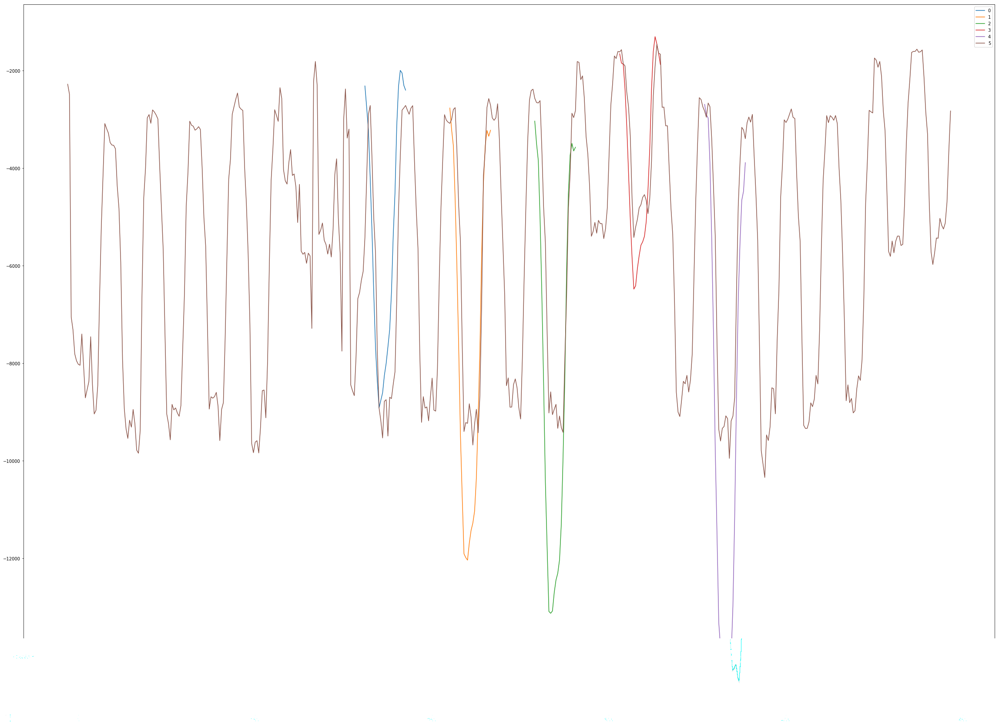

In [31]:
gen, base_data, scaler = get_gen_and_data(preprocessing="robust", customer='EastsideOffices', flatten=True)
model6.fit_generator(gen, epochs=20)
df_d = plot_for_model(model6, flatten=True)

Okay this seems to be doing alright for all kinds, but it is not perfect. Largely overestimating the peaks of the offices. However, it was still in the process of learning so another few rounds might solve that. 

In [32]:
gen, base_data, scaler = get_gen_and_data(preprocessing="robust", customer='EastsideOffices', flatten=True)
model6.fit_generator(gen, epochs=20)
df_d = plot_for_model(model6, flatten=True)

Epoch 1/20
147/147 [==============================] - 0s 3ms/step - loss: 75859.4662
Epoch 2/20
147/147 [==============================] - 0s 3ms/step - loss: 73977.6690
Epoch 3/20
147/147 [==============================] - 0s 3ms/step - loss: 73127.3127
Epoch 4/20
147/147 [==============================] - 0s 3ms/step - loss: 70656.7474
Epoch 5/20
147/147 [==============================] - 1s 3ms/step - loss: 68025.2806
Epoch 6/20
147/147 [==============================] - 0s 3ms/step - loss: 71036.4580
Epoch 7/20
147/147 [==============================] - 1s 4ms/step - loss: 70158.2586
Epoch 8/20
147/147 [==============================] - 1s 4ms/step - loss: 65453.8312
Epoch 9/20
147/147 [==============================] - 0s 3ms/step - loss: 64979.9985
Epoch 10/20
147/147 [==============================] - 1s 4ms/step - loss: 64126.3901
Epoch 11/20
147/147 [==============================] - 1s 4ms/step - loss: 64562.9334
Epoch 12/20
147/147 [==============================] - 0s 3ms/s

Slowly, but it is getting there. Let's train the model on a whole collection of customers for 10 epochs and then predict a few. 

### Applying the model to a whole game

In [41]:
from util.learning_utils import get_tb_cb
tb_cb = get_tb_cb('jupyter_dense_v7')

In [37]:
model7 = Sequential()
# input layer
input_shape = (cfg.DEMAND_ONE_WEEK,)
model7.add(Dense(168, input_shape=input_shape, activation='relu'))
model7.add(BatchNormalization())
model7.add(Dense(100, activation='relu'))
model7.add(Dense(100, activation='relu'))
model7.add(Dense(50, activation='relu'))
model7.add(Dense(50, activation='relu'))
model7.add(Dense(24))
model7.add(Activation('linear'))
model7.compile(loss='mse', optimizer='rmsprop')


In [34]:
clear() #clears data
d, scaler = parse_usage_game_log(f, pp_type='robust')

In [42]:
sequences = make_sequences_from_historical(True, scaler)
for s in sequences:
    # before
    model7.fit_generator(s, epochs=10, callbacks=[tb_cb])

Epoch 1/10
147/147 [==============================] - 0s 3ms/step - loss: 5.1066
Epoch 2/10
147/147 [==============================] - 1s 5ms/step - loss: 4.4814
Epoch 3/10
147/147 [==============================] - 0s 3ms/step - loss: 3.8887
Epoch 4/10
147/147 [==============================] - 1s 4ms/step - loss: 3.3389
Epoch 5/10
147/147 [==============================] - 1s 3ms/step - loss: 2.8327
Epoch 6/10
147/147 [==============================] - 0s 3ms/step - loss: 2.3692
Epoch 7/10
147/147 [==============================] - 1s 3ms/step - loss: 1.9493
Epoch 8/10
147/147 [==============================] - 1s 4ms/step - loss: 1.5718
Epoch 9/10
147/147 [==============================] - 0s 3ms/step - loss: 1.2381
Epoch 10/10
147/147 [==============================] - 1s 4ms/step - loss: 0.9454
Epoch 1/10
147/147 [==============================] - 0s 3ms/step - loss: 0.6573
Epoch 2/10
147/147 [==============================] - 1s 4ms/step - loss: 0.4446
Epoch 3/10
147/147 [=======

147/147 [==============================] - 0s 3ms/step - loss: 2.0954
Epoch 2/10
147/147 [==============================] - 1s 4ms/step - loss: 1.1064
Epoch 3/10
147/147 [==============================] - 1s 5ms/step - loss: 0.8501
Epoch 4/10
147/147 [==============================] - 1s 4ms/step - loss: 0.7236
Epoch 5/10
147/147 [==============================] - 1s 7ms/step - loss: 0.6428
Epoch 6/10
147/147 [==============================] - 1s 4ms/step - loss: 0.5846
Epoch 7/10
147/147 [==============================] - 0s 3ms/step - loss: 0.5416
Epoch 8/10
147/147 [==============================] - 1s 4ms/step - loss: 0.5019
Epoch 9/10
147/147 [==============================] - 1s 6ms/step - loss: 0.4735
Epoch 10/10
147/147 [==============================] - 1s 5ms/step - loss: 0.4577
Epoch 1/10
147/147 [==============================] - 1s 4ms/step - loss: 43.0345
Epoch 2/10
147/147 [==============================] - 1s 4ms/step - loss: 32.1701
Epoch 3/10
147/147 [================

147/147 [==============================] - 1s 4ms/step - loss: 0.1300
Epoch 3/10
147/147 [==============================] - 1s 3ms/step - loss: 0.1256
Epoch 4/10
147/147 [==============================] - 1s 5ms/step - loss: 0.1231
Epoch 5/10
147/147 [==============================] - 1s 4ms/step - loss: 0.1208
Epoch 6/10
147/147 [==============================] - 1s 4ms/step - loss: 0.1185
Epoch 7/10
147/147 [==============================] - 1s 4ms/step - loss: 0.1172
Epoch 8/10
147/147 [==============================] - 0s 3ms/step - loss: 0.1151
Epoch 9/10
147/147 [==============================] - 1s 4ms/step - loss: 0.1137
Epoch 10/10
147/147 [==============================] - 1s 4ms/step - loss: 0.1121
Epoch 1/10
147/147 [==============================] - 0s 2ms/step - loss: 0.0181
Epoch 2/10
147/147 [==============================] - 1s 4ms/step - loss: 0.0146
Epoch 3/10
147/147 [==============================] - 0s 3ms/step - loss: 0.0139
Epoch 4/10
147/147 [==================

147/147 [==============================] - 1s 5ms/step - loss: 0.3964
Epoch 3/10
147/147 [==============================] - 1s 3ms/step - loss: 0.3943
Epoch 4/10
147/147 [==============================] - 1s 3ms/step - loss: 0.3923
Epoch 5/10
147/147 [==============================] - 0s 3ms/step - loss: 0.3908
Epoch 6/10
147/147 [==============================] - 1s 5ms/step - loss: 0.3895
Epoch 7/10
147/147 [==============================] - 0s 3ms/step - loss: 0.3884
Epoch 8/10
147/147 [==============================] - 0s 3ms/step - loss: 0.3873
Epoch 9/10
147/147 [==============================] - 1s 4ms/step - loss: 0.3864
Epoch 10/10
147/147 [==============================] - 1s 4ms/step - loss: 0.3851
Epoch 1/10
147/147 [==============================] - 0s 2ms/step - loss: 0.2743
Epoch 2/10
147/147 [==============================] - 1s 7ms/step - loss: 0.2711
Epoch 3/10
147/147 [==============================] - 1s 5ms/step - loss: 0.2693
Epoch 4/10
147/147 [==================

147/147 [==============================] - 1s 4ms/step - loss: 2669413.6347
Epoch 3/10
147/147 [==============================] - 1s 4ms/step - loss: 2668811.2759
Epoch 4/10
147/147 [==============================] - 1s 5ms/step - loss: 2668343.3901
Epoch 5/10
147/147 [==============================] - 1s 4ms/step - loss: 2667885.8921
Epoch 6/10
147/147 [==============================] - 1s 4ms/step - loss: 2667430.4477
Epoch 7/10
147/147 [==============================] - 1s 5ms/step - loss: 2666972.8546
Epoch 8/10
147/147 [==============================] - 1s 3ms/step - loss: 2666517.2019
Epoch 9/10
147/147 [==============================] - 0s 3ms/step - loss: 2666062.5062
Epoch 10/10
147/147 [==============================] - 1s 4ms/step - loss: 2665606.1223
Epoch 1/10
147/147 [==============================] - 0s 2ms/step - loss: 13189.3030
Epoch 2/10
147/147 [==============================] - 0s 3ms/step - loss: 8099.8867
Epoch 3/10
147/147 [==============================] - 0s 3

147/147 [==============================] - 1s 7ms/step - loss: 0.7092
Epoch 3/10
147/147 [==============================] - 0s 3ms/step - loss: 0.7011
Epoch 4/10
147/147 [==============================] - 1s 4ms/step - loss: 0.6960
Epoch 5/10
147/147 [==============================] - 1s 5ms/step - loss: 0.6912
Epoch 6/10
147/147 [==============================] - 1s 5ms/step - loss: 0.6868
Epoch 7/10
147/147 [==============================] - 1s 5ms/step - loss: 0.6827
Epoch 8/10
147/147 [==============================] - 1s 6ms/step - loss: 0.6816
Epoch 9/10
147/147 [==============================] - 0s 3ms/step - loss: 0.6785
Epoch 10/10
147/147 [==============================] - 1s 6ms/step - loss: 0.6765
Epoch 1/10
147/147 [==============================] - 0s 2ms/step - loss: 0.0259
Epoch 2/10
147/147 [==============================] - 0s 3ms/step - loss: 0.0242
Epoch 3/10
147/147 [==============================] - 1s 5ms/step - loss: 0.0238
Epoch 4/10
147/147 [==================

147/147 [==============================] - 1s 3ms/step - loss: 0.4027
Epoch 4/10
147/147 [==============================] - 1s 5ms/step - loss: 0.3694
Epoch 5/10
147/147 [==============================] - 1s 5ms/step - loss: 0.3399
Epoch 6/10
147/147 [==============================] - 1s 3ms/step - loss: 0.3318
Epoch 7/10
147/147 [==============================] - 0s 3ms/step - loss: 0.3102
Epoch 8/10
147/147 [==============================] - 1s 3ms/step - loss: 0.2904
Epoch 9/10
147/147 [==============================] - 1s 4ms/step - loss: 0.2747
Epoch 10/10
147/147 [==============================] - 1s 7ms/step - loss: 0.2665
Epoch 1/10
147/147 [==============================] - 0s 3ms/step - loss: 29.8462
Epoch 2/10
147/147 [==============================] - 1s 4ms/step - loss: 26.0340
Epoch 3/10
147/147 [==============================] - 1s 6ms/step - loss: 24.0341
Epoch 4/10
147/147 [==============================] - 0s 3ms/step - loss: 22.7858
Epoch 5/10
147/147 [==============

147/147 [==============================] - 1s 4ms/step - loss: 313191.9243
Epoch 3/10
147/147 [==============================] - 1s 5ms/step - loss: 313294.5013
Epoch 4/10
147/147 [==============================] - 1s 4ms/step - loss: 295636.1417
Epoch 5/10
147/147 [==============================] - 1s 4ms/step - loss: 273959.2892
Epoch 6/10
147/147 [==============================] - 0s 3ms/step - loss: 250164.6776
Epoch 7/10
147/147 [==============================] - 1s 4ms/step - loss: 211850.2404
Epoch 8/10
147/147 [==============================] - 1s 4ms/step - loss: 175643.0264
Epoch 9/10
147/147 [==============================] - 1s 6ms/step - loss: 150840.8441
Epoch 10/10
147/147 [==============================] - 1s 5ms/step - loss: 131724.0596
Epoch 1/10
147/147 [==============================] - 0s 3ms/step - loss: 23224.9506
Epoch 2/10
147/147 [==============================] - 0s 3ms/step - loss: 1.4077
Epoch 3/10
147/147 [==============================] - 1s 5ms/step - lo

147/147 [==============================] - 1s 4ms/step - loss: 0.4227
Epoch 3/10
147/147 [==============================] - 1s 4ms/step - loss: 0.4196
Epoch 4/10
147/147 [==============================] - 1s 5ms/step - loss: 0.4186
Epoch 5/10
147/147 [==============================] - 1s 5ms/step - loss: 0.4135
Epoch 6/10
147/147 [==============================] - 1s 4ms/step - loss: 0.4120
Epoch 7/10
147/147 [==============================] - 1s 10ms/step - loss: 0.4105
Epoch 8/10
147/147 [==============================] - 1s 6ms/step - loss: 0.4086
Epoch 9/10
147/147 [==============================] - 1s 3ms/step - loss: 0.4301
Epoch 10/10
147/147 [==============================] - 1s 4ms/step - loss: 0.4055
Epoch 1/10
147/147 [==============================] - 0s 2ms/step - loss: 0.0640
Epoch 2/10
147/147 [==============================] - 1s 5ms/step - loss: 0.0618
Epoch 3/10
147/147 [==============================] - 0s 3ms/step - loss: 0.0616
Epoch 4/10
147/147 [=================

147/147 [==============================] - 0s 3ms/step - loss: 4.5895
Epoch 2/10
147/147 [==============================] - 1s 5ms/step - loss: 0.2862
Epoch 3/10
147/147 [==============================] - 1s 4ms/step - loss: 0.4215
Epoch 4/10
147/147 [==============================] - 0s 3ms/step - loss: 1.3965
Epoch 5/10
147/147 [==============================] - 1s 5ms/step - loss: 4.6931
Epoch 6/10
147/147 [==============================] - 0s 3ms/step - loss: 8.7010
Epoch 7/10
147/147 [==============================] - 0s 3ms/step - loss: 0.2794
Epoch 8/10
147/147 [==============================] - 1s 4ms/step - loss: 4.7690
Epoch 9/10
147/147 [==============================] - 1s 3ms/step - loss: 0.2773
Epoch 10/10
147/147 [==============================] - 1s 3ms/step - loss: 0.4803
Epoch 1/10
147/147 [==============================] - 0s 3ms/step - loss: 0.4758
Epoch 2/10
147/147 [==============================] - 1s 4ms/step - loss: 0.2219
Epoch 3/10
147/147 [==================

(500, 6)


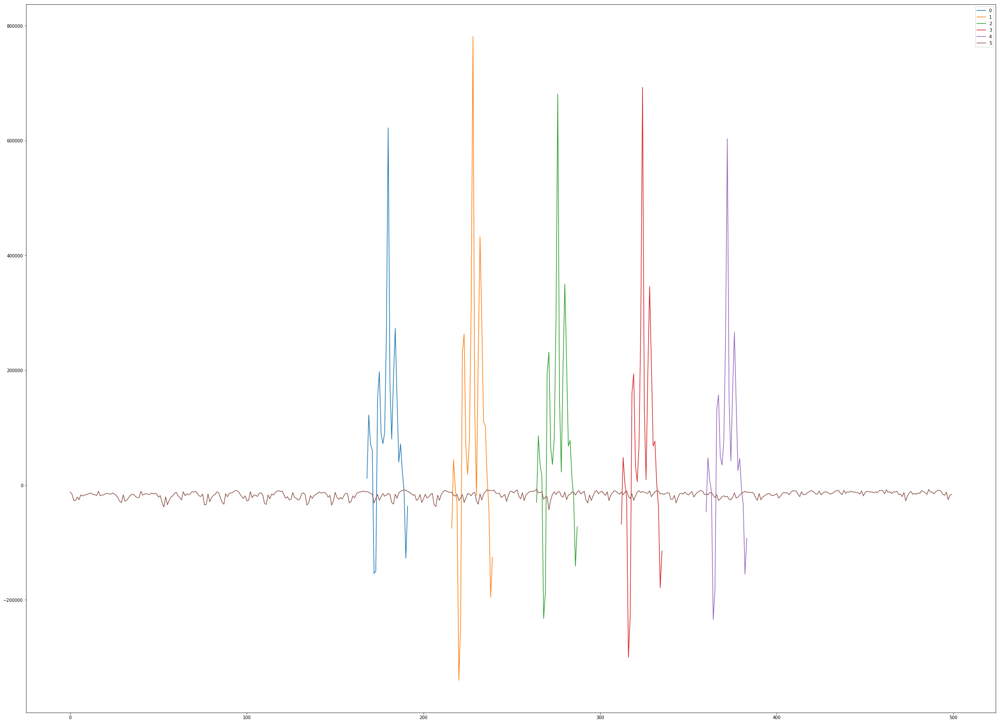

In [46]:
gen, base_data, scaler = get_gen_and_data(preprocessing="robust", flatten=True)
df_d = plot_for_model(model7, flatten=True)

## One model per customer

Okay that is seriously crap! So I guess variant number two: One model and one scaler per customer. Let's see what fits in my ram!

In [47]:
models = {}
for i in range(250):
    model7 = Sequential()
    # input layer
    input_shape = (cfg.DEMAND_ONE_WEEK,)
    model7.add(Dense(168, input_shape=input_shape, activation='relu'))
    model7.add(BatchNormalization())
    model7.add(Dense(100, activation='relu'))
    model7.add(Dense(100, activation='relu'))
    model7.add(Dense(50, activation='relu'))
    model7.add(Dense(50, activation='relu'))
    model7.add(Dense(24))
    model7.add(Activation('linear'))
    model7.compile(loss='mse', optimizer='rmsprop')
    models[i] = model7

    

In [48]:
models

{0: <keras.models.Sequential at 0x7fb2eb002e10>,
 1: <keras.models.Sequential at 0x7fb2eb45ffd0>,
 2: <keras.models.Sequential at 0x7fb2eafe3f28>,
 3: <keras.models.Sequential at 0x7fb2eaea1f60>,
 4: <keras.models.Sequential at 0x7fb2eac36e48>,
 5: <keras.models.Sequential at 0x7fb32312b0f0>,
 6: <keras.models.Sequential at 0x7fb322f735c0>,
 7: <keras.models.Sequential at 0x7fb322db64a8>,
 8: <keras.models.Sequential at 0x7fb322bf6390>,
 9: <keras.models.Sequential at 0x7fb3229bff28>,
 10: <keras.models.Sequential at 0x7fb322803160>,
 11: <keras.models.Sequential at 0x7fb2eace1588>,
 12: <keras.models.Sequential at 0x7fb2eab5c400>,
 13: <keras.models.Sequential at 0x7fb32254dfd0>,
 14: <keras.models.Sequential at 0x7fb322386f60>,
 15: <keras.models.Sequential at 0x7fb318f61400>,
 16: <keras.models.Sequential at 0x7fb318d9d550>,
 17: <keras.models.Sequential at 0x7fb318bd30b8>,
 18: <keras.models.Sequential at 0x7fb318a19e48>,
 19: <keras.models.Sequential at 0x7fb311ff1f98>,
 20: <kera

Okay that took about 1GB of memory. survivable. So I could theoretically have a model per customer, store all of them and then select the correct model for each customer that requires a prediction. That's some organizational overhead but doesn't hurt very much. It would also require a scaling for each customer, ideally based on the bootstrap data for that customer or, based on a historical games min/max.

In [11]:
model7 = Sequential()
    # input layer
input_shape = (cfg.DEMAND_ONE_WEEK,)
model7.add(Dense(168, input_shape=input_shape, activation='linear'))
model7.add(BatchNormalization()) #applying batch normalization now
model7.add(Dense(100, activation='linear'))
model7.add(Dense(50, activation='linear'))
model7.add(Dense(24))
model7.add(Activation('linear'))
model7.compile(loss='mse', optimizer='rmsprop')


m =model7

Epoch 1/100
37/37 [==============================] - 0s 3ms/step - loss: 0.3562
Epoch 2/100
37/37 [==============================] - 0s 6ms/step - loss: 0.3532
Epoch 3/100
37/37 [==============================] - 0s 7ms/step - loss: 0.3507
Epoch 4/100
37/37 [==============================] - 0s 6ms/step - loss: 0.3586
Epoch 5/100
37/37 [==============================] - 0s 7ms/step - loss: 0.3347
Epoch 6/100
37/37 [==============================] - 0s 6ms/step - loss: 0.3285
Epoch 7/100
37/37 [==============================] - 0s 7ms/step - loss: 0.3436
Epoch 8/100
37/37 [==============================] - 0s 6ms/step - loss: 0.3164
Epoch 9/100
37/37 [==============================] - 0s 6ms/step - loss: 0.3411
Epoch 10/100
37/37 [==============================] - 0s 6ms/step - loss: 0.3315
Epoch 11/100
37/37 [==============================] - 0s 7ms/step - loss: 0.3113
Epoch 12/100
37/37 [==============================] - 0s 7ms/step - loss: 0.3357
Epoch 13/100
37/37 [=================

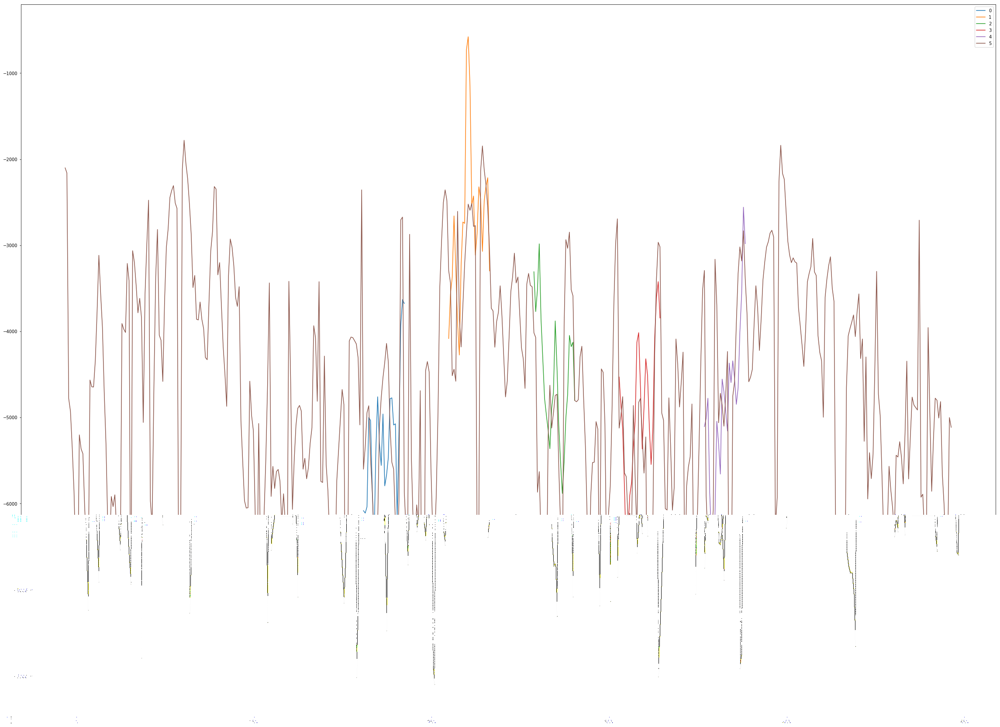

In [16]:
#learning on game A
f = game_files[4]
gen, base_data, scaler = get_gen_and_data(flatten=True, customer='EastsideOffices', preprocessing='standard')
#plotting once before, to get the random performance
#df_d = plot_for_model(m, flatten=True)
m.fit_generator(gen, epochs=100, callbacks=[tb_cb])
#predicting on game B
f = game_files[6]
gen, base_data, scaler = get_gen_and_data(flatten=True, customer='EastsideOffices', preprocessing='standard')
df_d = plot_for_model(m, flatten=True)

In [17]:
#different game
f = game_files[8]
gen, base_data, scaler = get_gen_and_data(flatten=True, customer='EastsideOffices', preprocessing='standard')
df_d = plot_for_model(m, flatten=True)

(500, 6)


In [18]:
#and another one
f = game_files[20]
gen, base_data, scaler = get_gen_and_data(flatten=True, customer='EastsideOffices', preprocessing='standard')
df_d = plot_for_model(m, flatten=True)

(500, 6)


(500, 6)


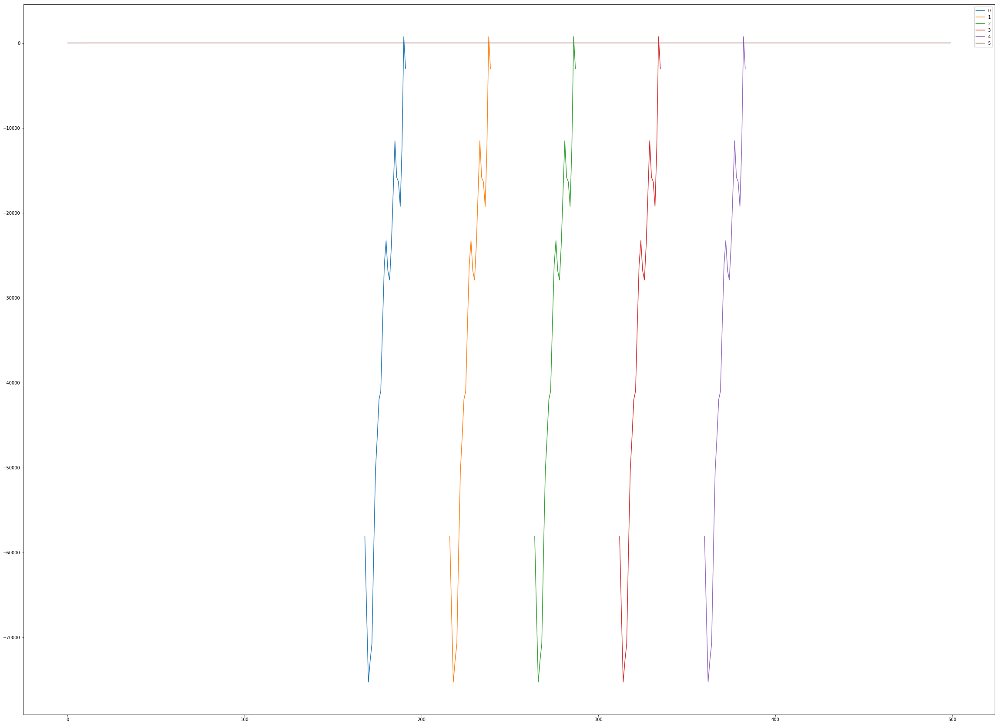

In [19]:
# trying on a different customer now
gen, base_data, scaler = get_gen_and_data(customer='MiddleIncome-3_15', flatten=True)
df_d = plot_for_model(model7, flatten=True)

That looks terrible. But it is because the scaling is based on the whole game data. In the later structure, a scaler will be defined for each customer model

In [48]:
#terrible. training a new model though should work just fine
model8 = Sequential()
    # input layer
input_shape = (cfg.DEMAND_ONE_WEEK,)
model8.add(Dense(168, input_shape=input_shape, activation='linear'))
model8.add(BatchNormalization()) #applying batch normalization now
model8.add(Dense(100, activation='linear'))
model8.add(Dense(50, activation='linear'))
model8.add(Dense(24))
model8.add(Activation('linear'))
model8.compile(loss='mse', optimizer='rmsprop')


In [49]:


scaler = StandardScaler()
base_data = data.demand_data["MiddleIncome-3_15"]
scaler.fit(base_data.reshape(-1,1))
base_data = scaler.transform(base_data.reshape(-1,1)).flatten()
#stealing some code from the data.py file
# let's create a targets array by shifting the original by one
ys = np.zeros((len(base_data), 24))
for i in range(len(base_data)):
    twen4h = base_data[i + 1:i + 25]
    #if scaler is not None and len(twen4h) > 0:
    #    twen4h = scaler.inverse_transform(twen4h.reshape(-1,1)).flatten()
    ys[i][0:len(twen4h)] = twen4h

gen = TimeseriesGenerator(base_data, ys, length=168, batch_size=32)

#got a scaled data generator, let's learn on it
model8.fit_generator(gen, epochs=100)
df_d = plot_for_model(model8, flatten=True)

Epoch 1/100
37/37 [==============================] - 0s 10ms/step - loss: 1.2175
Epoch 2/100
37/37 [==============================] - 0s 6ms/step - loss: 1.0288
Epoch 3/100
37/37 [==============================] - 0s 7ms/step - loss: 0.9490
Epoch 4/100
37/37 [==============================] - 0s 6ms/step - loss: 0.8978
Epoch 5/100
37/37 [==============================] - 0s 6ms/step - loss: 0.8562
Epoch 6/100
37/37 [==============================] - 0s 6ms/step - loss: 0.8246
Epoch 7/100
37/37 [==============================] - 0s 6ms/step - loss: 0.7957
Epoch 8/100
37/37 [==============================] - 0s 6ms/step - loss: 0.7664
Epoch 9/100
37/37 [==============================] - 0s 6ms/step - loss: 0.7431
Epoch 10/100
37/37 [==============================] - 0s 5ms/step - loss: 0.7159
Epoch 11/100
37/37 [==============================] - 0s 6ms/step - loss: 0.6918
Epoch 12/100
37/37 [==============================] - 0s 6ms/step - loss: 0.6648
Epoch 13/100
37/37 [================

Much better!

----

# New problem: Too slow! Need to make it work with one model for all customers!

Some ideas:

- using 1 scaler per customer but one model for all
- larger network


In [130]:
#terrible. training a new model though should work just fine
model_unif = Sequential()
    # input layer
input_shape = (cfg.DEMAND_ONE_WEEK,)
model_unif.add(Dense(168, input_shape=input_shape, activation='linear'))
model_unif.add(BatchNormalization()) #applying batch normalization now
model_unif.add(Dense(100, activation='relu'))
model_unif.add(Dense(100, activation='relu'))
model_unif.add(Dense(100, activation='relu'))
model_unif.add(Dense(50, activation='relu'))
model_unif.add(Dense(50, activation='relu'))
model_unif.add(Dense(24))
model_unif.add(Activation('linear'))
model_unif.compile(loss='mse', optimizer='rmsprop')

In [152]:
customers = ["BrooksideHomes", "MiddleIncome-3_15","OfficeComplex 2 NS Controllable","MedicalCenter-1","DowntownOffices", "FrostyStorage"]
scalers = {}
def learning_multiple(model, customers, epochs=10):
    f = game_files[20]
    clear()
    d, scaler = parse_usage_game_log(f, pp_type='none')

    #customers = ["MedicalCenter-1"]

    for cu in customers:
        cu_data = data.demand_data[cu]
        data_inverse = cu_data.reshape(-1,1)
        scaler = MinMaxScaler()
        scaler.fit(data_inverse)
        print("{} min".format(cu_data.min()))
        print("{} max".format(cu_data.max()))
        scaled_data = scaler.transform(data_inverse).flatten()
        print("{} min scaled".format(scaled_data.min()))
        print("{} max scaled".format(scaled_data.max()))
        #keep this scaler!
        scalers[cu] = scaler

        #forecast targets
        ys = np.zeros((len(base_data), 24))
        for i in range(len(base_data)):
            twen4h = scaled_data[i + 1:i + 25]
            ys[i][0:len(twen4h)] = twen4h

        gen = TimeseriesGenerator(scaled_data, ys, length=168, batch_size=32)
        #got a scaled data generator, let's learn on it
        print("learning model {}".format(cu))
        model.fit_generator(gen, epochs=epochs, verbose=1)
    


In [126]:
learning_multiple(model_unif, customers)

-3.3 min
3.3 max
0.0 min scaled
1.0 max scaled
learning model MiddleIncome-3_15
Epoch 1/10
37/37 [==============================] - 1s 24ms/step - loss: 0.1270
Epoch 2/10
37/37 [==============================] - 0s 7ms/step - loss: 0.0910
Epoch 3/10
37/37 [==============================] - 0s 6ms/step - loss: 0.0848
Epoch 4/10
37/37 [==============================] - 0s 7ms/step - loss: 0.0814
Epoch 5/10
37/37 [==============================] - 0s 6ms/step - loss: 0.0766
Epoch 6/10
37/37 [==============================] - 0s 6ms/step - loss: 0.0740
Epoch 7/10
37/37 [==============================] - 0s 6ms/step - loss: 0.0704
Epoch 8/10
37/37 [==============================] - 0s 6ms/step - loss: 0.0677
Epoch 9/10
37/37 [==============================] - 0s 7ms/step - loss: 0.0648
Epoch 10/10
37/37 [==============================] - 0s 6ms/step - loss: 0.0618
-15.532 min
-2.089 max
0.0 min scaled
1.0 max scaled
learning model OfficeComplex 2 NS Controllable
Epoch 1/10
37/37 [==========

MiddleIncome-3_15
[0.         0.09090909 0.5        ... 0.25166667 0.5        0.5       ]
(500, 6)
OfficeComplex 2 NS Controllable
[1.         1.         1.         ... 0.90627092 0.8750279  0.8750279 ]
(500, 6)
MedicalCenter-1
[0.54365504 0.74819415 0.66951289 ... 0.49348374 0.47553486 0.35181433]
(500, 6)
DowntownOffices
[0.84092673 0.89529858 0.86185903 ... 0.37250225 0.34495796 0.32173617]
(500, 6)
FrostyStorage
[0.52143245 0.48557633 0.50551286 ... 0.23764065 0.22442536 0.23886428]
(500, 6)


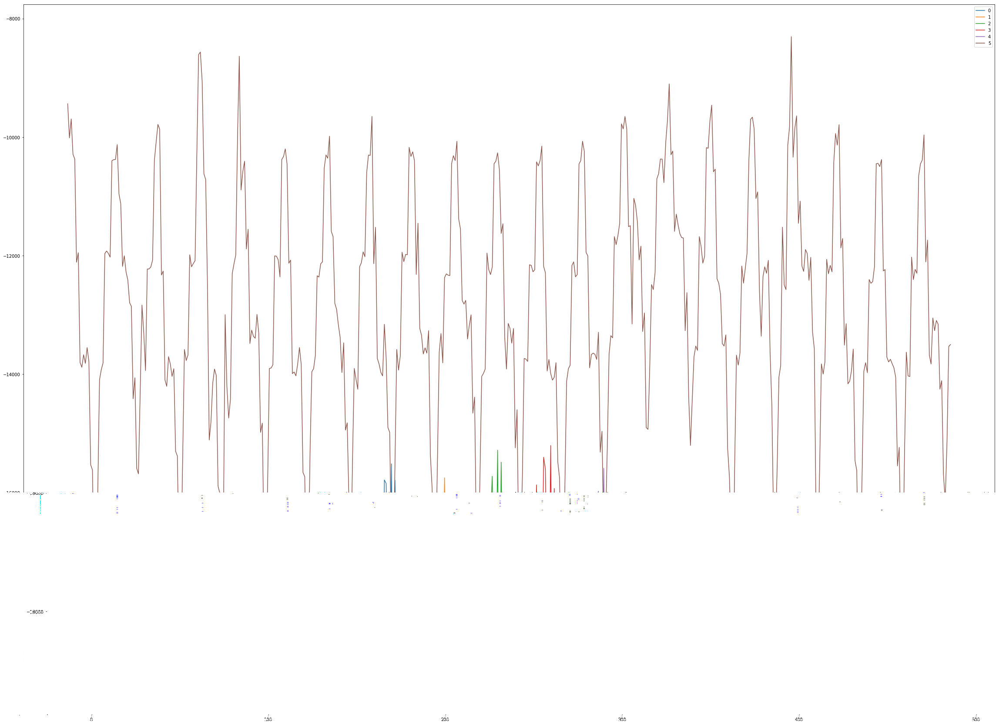

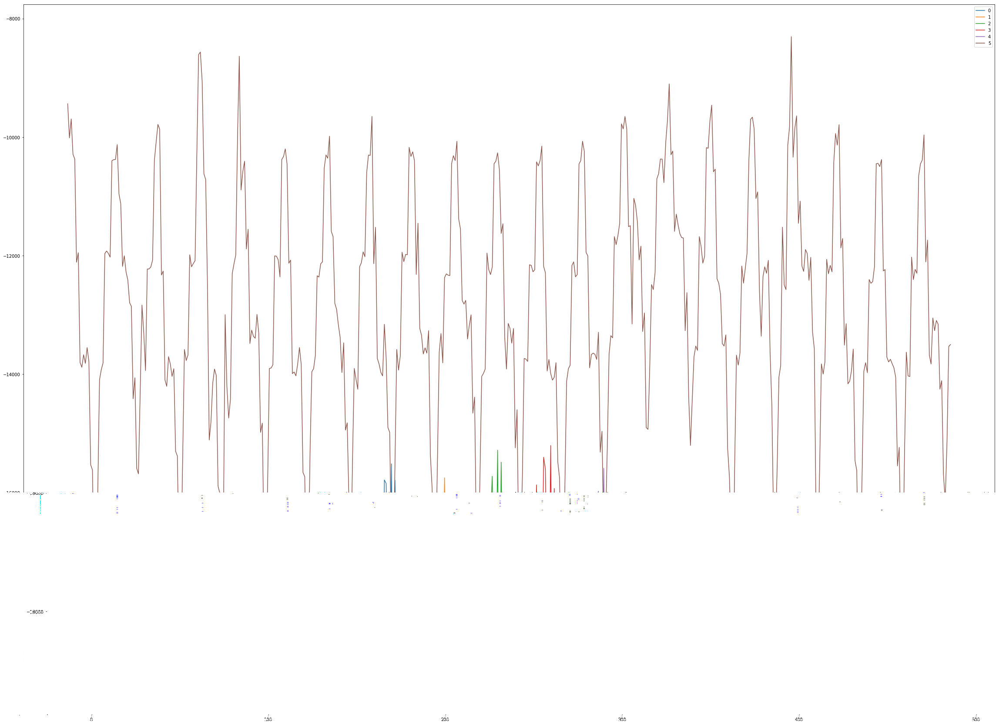

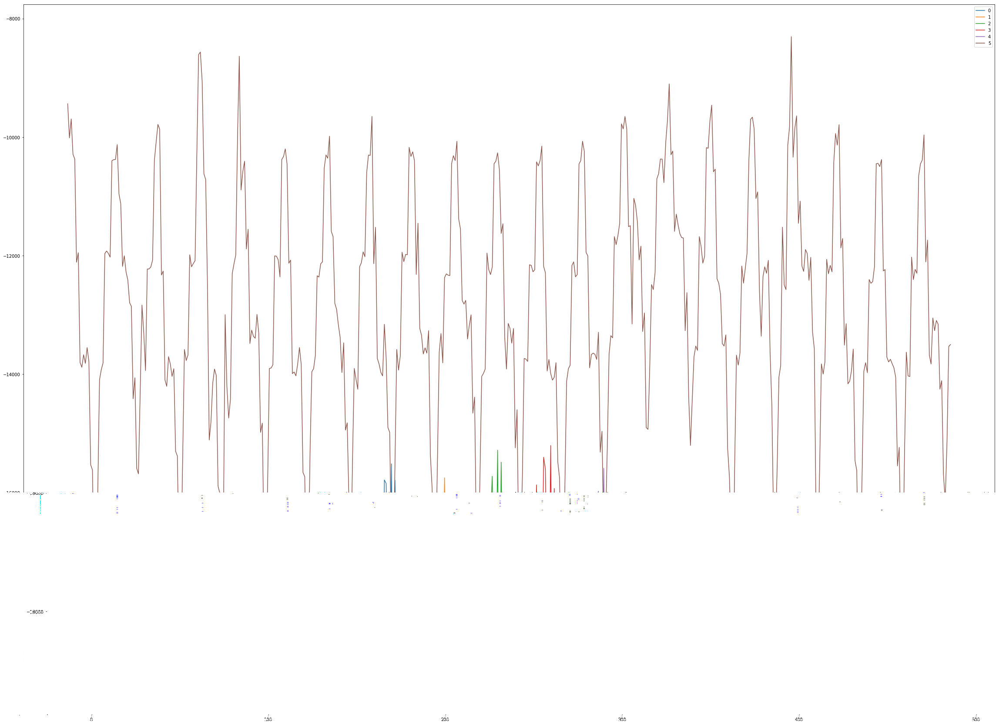

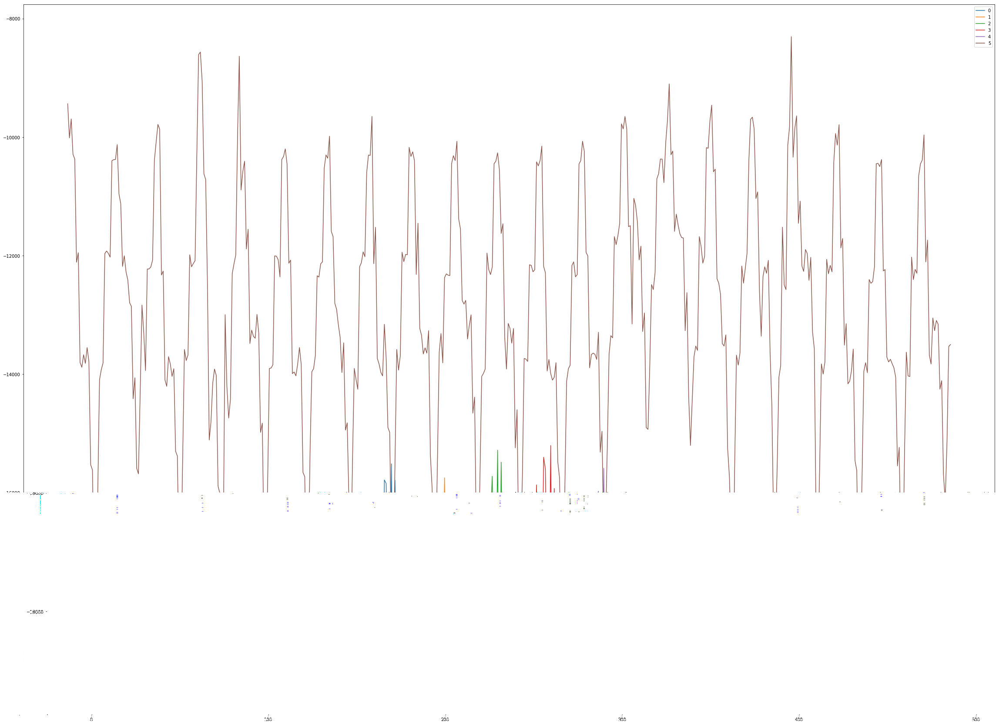

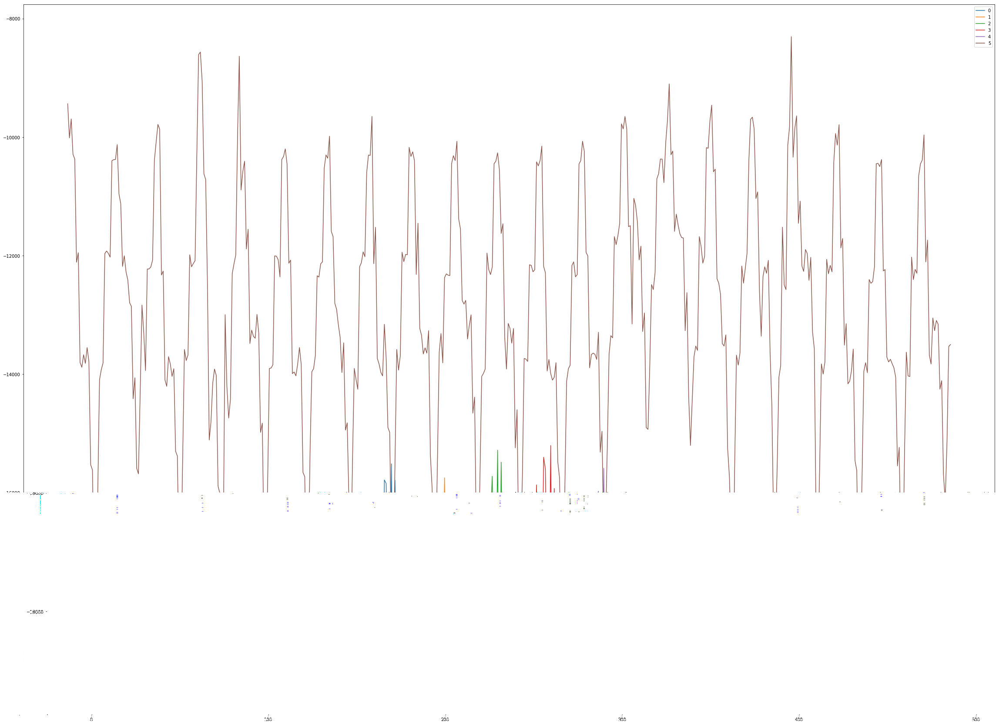

In [131]:
def plot_multiple(model, customers):
    for cu in customers:
        print(cu)
        #getting the data and scaler. this is extremely dirty, because the 
        #plot_for_model function needs these two variables to function.
        base_data = data.demand_data[cu]
        scaler = scalers[cu]
        base_data = scaler.transform(base_data.reshape(-1,1)).flatten()
        plot_for_model(model, flatten=True)
        
plot_multiple(model_unif, customers)

It almost looks as if the neural network learns something but then that learnt behavior gets huddled up after seeingo ther variants of usage. how can I keep it from forgetting?

In [162]:
from keras.optimizers import RMSprop

model_unif = Sequential()
    # input layer
input_shape = (cfg.DEMAND_ONE_WEEK,)
model_unif.add(Dense(168, input_shape=input_shape, activation='relu'))
model_unif.add(Dense(100, activation='relu'))
model_unif.add(Dense(100, activation='relu'))
model_unif.add(Dense(100, activation='relu'))
model_unif.add(Dense(50, activation='relu'))
model_unif.add(Dense(50, activation='relu'))
model_unif.add(Dense(24))
model_unif.add(Activation('linear'))
#opti = RMSprop(lr=0.01)
model_unif.compile(loss='mse', optimizer='SGD')


In [167]:
def learning_multiple_random_input_seq(model, customers, epochs=10):
    f = game_files[20]
    clear()
    d, scaler = parse_usage_game_log(f, pp_type='none')
    gens = []

    for cu in customers:
        cu_data = data.demand_data[cu]
        data_inverse = cu_data.reshape(-1,1)
        scaler = MinMaxScaler()
        scaler.fit(data_inverse)
        print("{} min".format(cu_data.min()))
        print("{} max".format(cu_data.max()))
        scaled_data = scaler.transform(data_inverse).flatten()
        print("{} min scaled".format(scaled_data.min()))
        print("{} max scaled".format(scaled_data.max()))
        #keep this scaler!
        scalers[cu] = scaler

        #forecast targets
        ys = np.zeros((len(base_data), 24))
        for i in range(len(base_data)):
            twen4h = scaled_data[i + 1:i + 25]
            ys[i][0:len(twen4h)] = twen4h

        gen = TimeseriesGenerator(scaled_data, ys, length=168, batch_size=32)
        gens.append(gen)
    steps = len(gens)*epochs*50*100
    for i in range(steps):
        gen = random.choice(gens)
        if i%100==0:
            print("{} / {}".format(i, steps))
        model.fit_generator(gen, epochs=1, steps_per_epoch=len(gens[0])/50, verbose=0)

learning_multiple_random_input_seq(model_unif, customers)

-39274.37 min
-8056.26 max
0.0 min scaled
1.0000000000000002 max scaled
-3.3 min
3.3 max
0.0 min scaled
1.0 max scaled
-15.532 min
-2.089 max
0.0 min scaled
1.0 max scaled
-8623.66 min
-2967.04 max
0.0 min scaled
0.9999999999999999 max scaled
-13257.63 min
-1482.05 max
0.0 min scaled
1.0 max scaled
-17814.38 min
-1747.39 max
0.0 min scaled
0.9999999999999999 max scaled
0 / 300000
100 / 300000
200 / 300000
300 / 300000
400 / 300000
500 / 300000
600 / 300000
700 / 300000
800 / 300000
900 / 300000
1000 / 300000
1100 / 300000
1200 / 300000
1300 / 300000
1400 / 300000
1500 / 300000
1600 / 300000
1700 / 300000
1800 / 300000
1900 / 300000
2000 / 300000
2100 / 300000
2200 / 300000
2300 / 300000
2400 / 300000
2500 / 300000
2600 / 300000
2700 / 300000
2800 / 300000
2900 / 300000
3000 / 300000
3100 / 300000
3200 / 300000
3300 / 300000
3400 / 300000
3500 / 300000
3600 / 300000
3700 / 300000
3800 / 300000
3900 / 300000
4000 / 300000
4100 / 300000
4200 / 300000
4300 / 300000
4400 / 300000
4500 / 300

52900 / 300000
53000 / 300000
53100 / 300000
53200 / 300000
53300 / 300000
53400 / 300000
53500 / 300000
53600 / 300000
53700 / 300000
53800 / 300000
53900 / 300000
54000 / 300000
54100 / 300000
54200 / 300000
54300 / 300000
54400 / 300000
54500 / 300000
54600 / 300000
54700 / 300000
54800 / 300000
54900 / 300000
55000 / 300000
55100 / 300000
55200 / 300000
55300 / 300000
55400 / 300000
55500 / 300000
55600 / 300000
55700 / 300000
55800 / 300000
55900 / 300000
56000 / 300000
56100 / 300000
56200 / 300000
56300 / 300000
56400 / 300000
56500 / 300000
56600 / 300000
56700 / 300000
56800 / 300000
56900 / 300000
57000 / 300000
57100 / 300000
57200 / 300000
57300 / 300000
57400 / 300000
57500 / 300000
57600 / 300000
57700 / 300000
57800 / 300000
57900 / 300000
58000 / 300000
58100 / 300000
58200 / 300000
58300 / 300000
58400 / 300000
58500 / 300000
58600 / 300000
58700 / 300000
58800 / 300000
58900 / 300000
59000 / 300000
59100 / 300000
59200 / 300000
59300 / 300000
59400 / 300000
59500 / 30

107100 / 300000
107200 / 300000
107300 / 300000
107400 / 300000
107500 / 300000
107600 / 300000
107700 / 300000
107800 / 300000
107900 / 300000
108000 / 300000
108100 / 300000
108200 / 300000
108300 / 300000
108400 / 300000
108500 / 300000
108600 / 300000
108700 / 300000
108800 / 300000
108900 / 300000
109000 / 300000
109100 / 300000
109200 / 300000
109300 / 300000
109400 / 300000
109500 / 300000
109600 / 300000
109700 / 300000
109800 / 300000
109900 / 300000
110000 / 300000
110100 / 300000
110200 / 300000
110300 / 300000
110400 / 300000
110500 / 300000
110600 / 300000
110700 / 300000
110800 / 300000
110900 / 300000
111000 / 300000
111100 / 300000
111200 / 300000
111300 / 300000
111400 / 300000
111500 / 300000
111600 / 300000
111700 / 300000
111800 / 300000
111900 / 300000
112000 / 300000
112100 / 300000
112200 / 300000
112300 / 300000
112400 / 300000
112500 / 300000
112600 / 300000
112700 / 300000
112800 / 300000
112900 / 300000
113000 / 300000
113100 / 300000
113200 / 300000
113300 /

158400 / 300000
158500 / 300000
158600 / 300000
158700 / 300000
158800 / 300000
158900 / 300000
159000 / 300000
159100 / 300000
159200 / 300000
159300 / 300000
159400 / 300000
159500 / 300000
159600 / 300000
159700 / 300000
159800 / 300000
159900 / 300000
160000 / 300000
160100 / 300000
160200 / 300000
160300 / 300000
160400 / 300000
160500 / 300000
160600 / 300000
160700 / 300000
160800 / 300000
160900 / 300000
161000 / 300000
161100 / 300000
161200 / 300000
161300 / 300000
161400 / 300000
161500 / 300000
161600 / 300000
161700 / 300000
161800 / 300000
161900 / 300000
162000 / 300000
162100 / 300000
162200 / 300000
162300 / 300000
162400 / 300000
162500 / 300000
162600 / 300000
162700 / 300000
162800 / 300000
162900 / 300000
163000 / 300000
163100 / 300000
163200 / 300000
163300 / 300000
163400 / 300000
163500 / 300000
163600 / 300000
163700 / 300000
163800 / 300000
163900 / 300000
164000 / 300000
164100 / 300000
164200 / 300000
164300 / 300000
164400 / 300000
164500 / 300000
164600 /

209700 / 300000
209800 / 300000
209900 / 300000
210000 / 300000
210100 / 300000
210200 / 300000
210300 / 300000
210400 / 300000
210500 / 300000
210600 / 300000
210700 / 300000
210800 / 300000
210900 / 300000
211000 / 300000
211100 / 300000
211200 / 300000
211300 / 300000
211400 / 300000
211500 / 300000
211600 / 300000
211700 / 300000
211800 / 300000
211900 / 300000
212000 / 300000
212100 / 300000
212200 / 300000
212300 / 300000
212400 / 300000
212500 / 300000
212600 / 300000
212700 / 300000
212800 / 300000
212900 / 300000
213000 / 300000
213100 / 300000
213200 / 300000
213300 / 300000
213400 / 300000
213500 / 300000
213600 / 300000
213700 / 300000
213800 / 300000
213900 / 300000
214000 / 300000
214100 / 300000
214200 / 300000
214300 / 300000
214400 / 300000
214500 / 300000
214600 / 300000
214700 / 300000
214800 / 300000
214900 / 300000
215000 / 300000
215100 / 300000
215200 / 300000
215300 / 300000
215400 / 300000
215500 / 300000
215600 / 300000
215700 / 300000
215800 / 300000
215900 /

261000 / 300000
261100 / 300000
261200 / 300000
261300 / 300000
261400 / 300000
261500 / 300000
261600 / 300000
261700 / 300000
261800 / 300000
261900 / 300000
262000 / 300000
262100 / 300000
262200 / 300000
262300 / 300000
262400 / 300000
262500 / 300000
262600 / 300000
262700 / 300000
262800 / 300000
262900 / 300000
263000 / 300000
263100 / 300000
263200 / 300000
263300 / 300000
263400 / 300000
263500 / 300000
263600 / 300000
263700 / 300000
263800 / 300000
263900 / 300000
264000 / 300000
264100 / 300000
264200 / 300000
264300 / 300000
264400 / 300000
264500 / 300000
264600 / 300000
264700 / 300000
264800 / 300000
264900 / 300000
265000 / 300000
265100 / 300000
265200 / 300000
265300 / 300000
265400 / 300000
265500 / 300000
265600 / 300000
265700 / 300000
265800 / 300000
265900 / 300000
266000 / 300000
266100 / 300000
266200 / 300000
266300 / 300000
266400 / 300000
266500 / 300000
266600 / 300000
266700 / 300000
266800 / 300000
266900 / 300000
267000 / 300000
267100 / 300000
267200 /

BrooksideHomes
(500, 6)
MiddleIncome-3_15
(500, 6)
OfficeComplex 2 NS Controllable
(500, 6)
MedicalCenter-1
(500, 6)
DowntownOffices
(500, 6)
FrostyStorage
(500, 6)


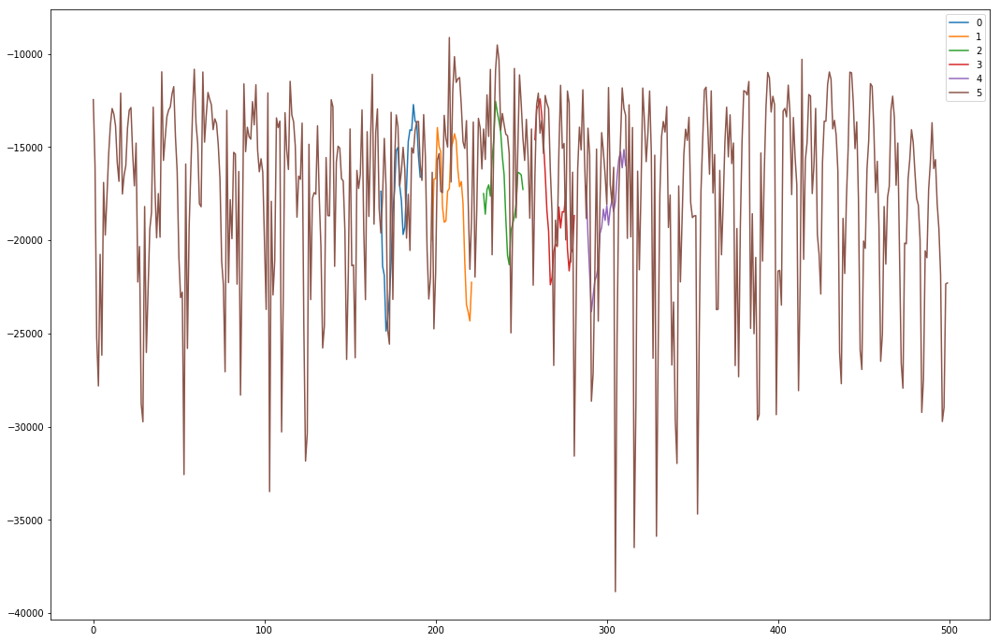

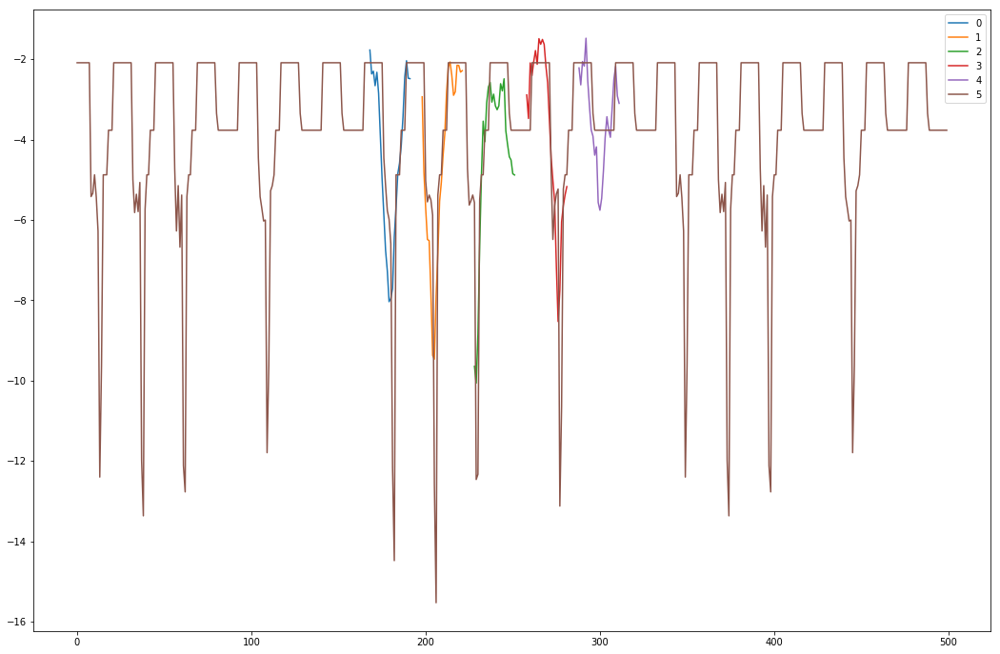

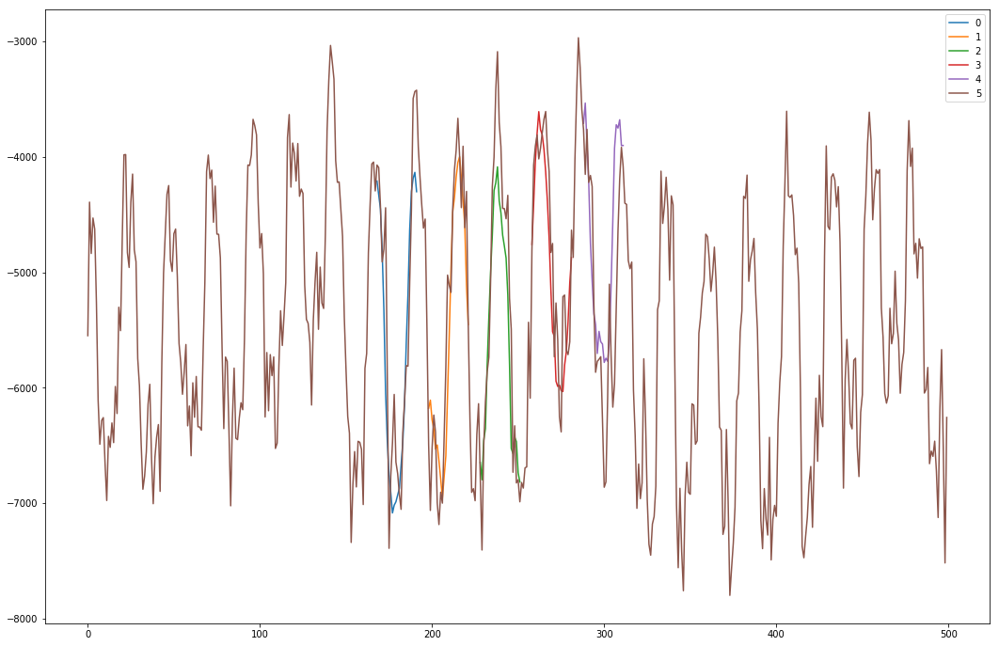

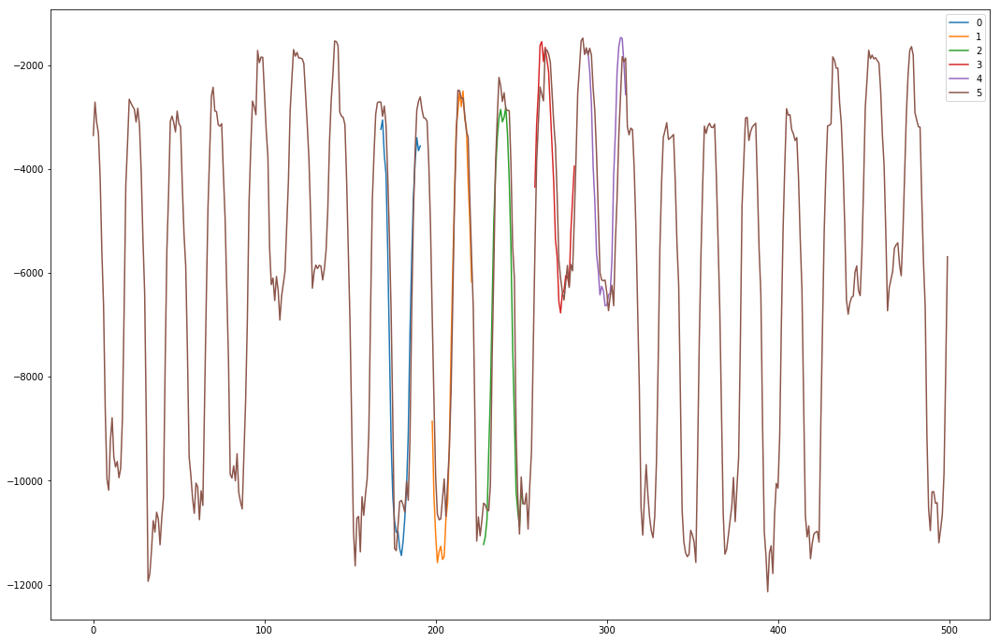

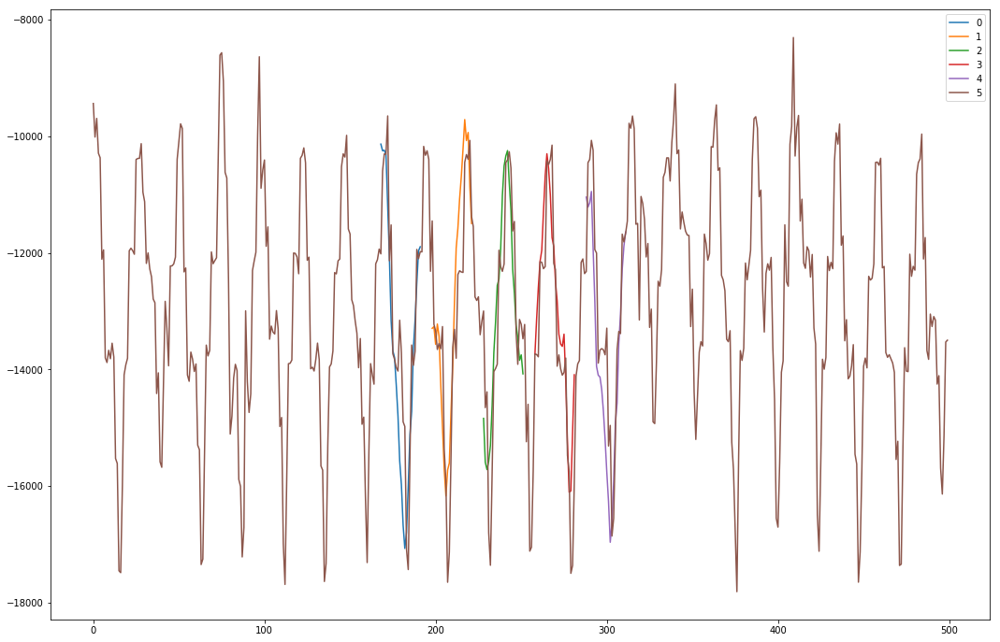

In [168]:
for cu in customers:
        print(cu)
        #getting the data and scaler. this is extremely dirty, because the 
        #plot_for_model function needs these two variables to function.
        base_data = data.demand_data[cu]
        scaler = scalers[cu]
        base_data = scaler.transform(base_data.reshape(-1,1)).flatten()
        plot_for_model(model_unif, flatten=True, figsize=(18,12))

Finally, let's try this against a DIFFERENT GAME!. If this works, it's the golden nugget!

BrooksideHomes
(500, 6)
MiddleIncome-3_15
(500, 6)
OfficeComplex 2 NS Controllable
(500, 6)
MedicalCenter-1
(500, 6)
DowntownOffices
(500, 6)
FrostyStorage
(500, 6)


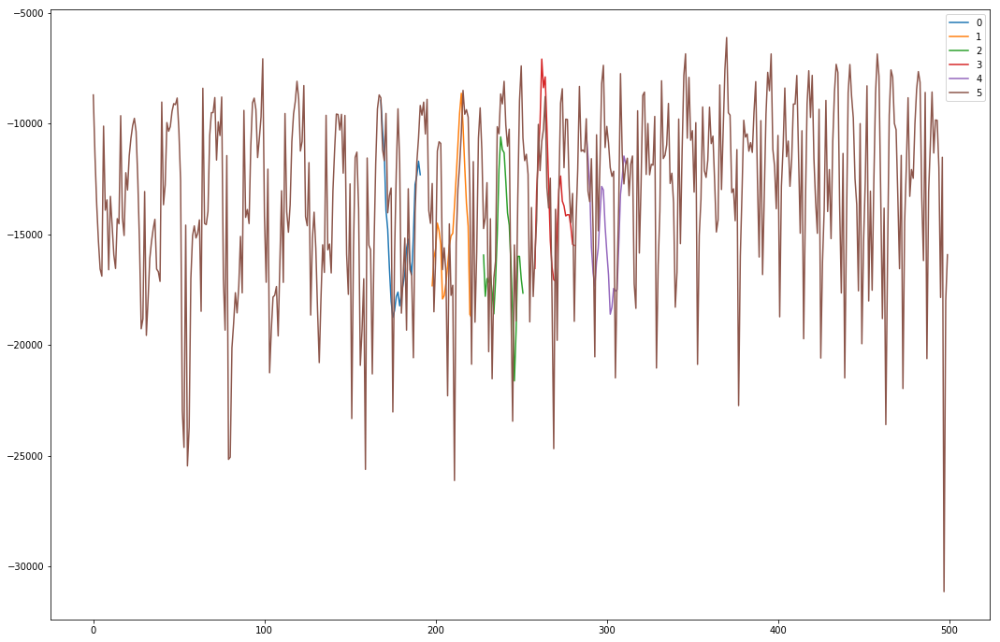

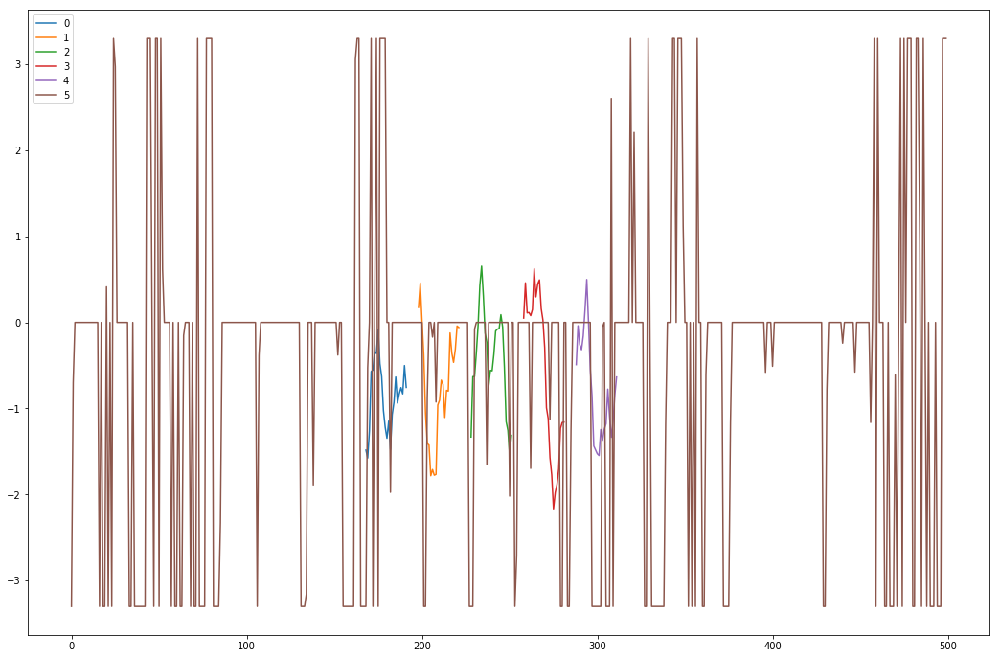

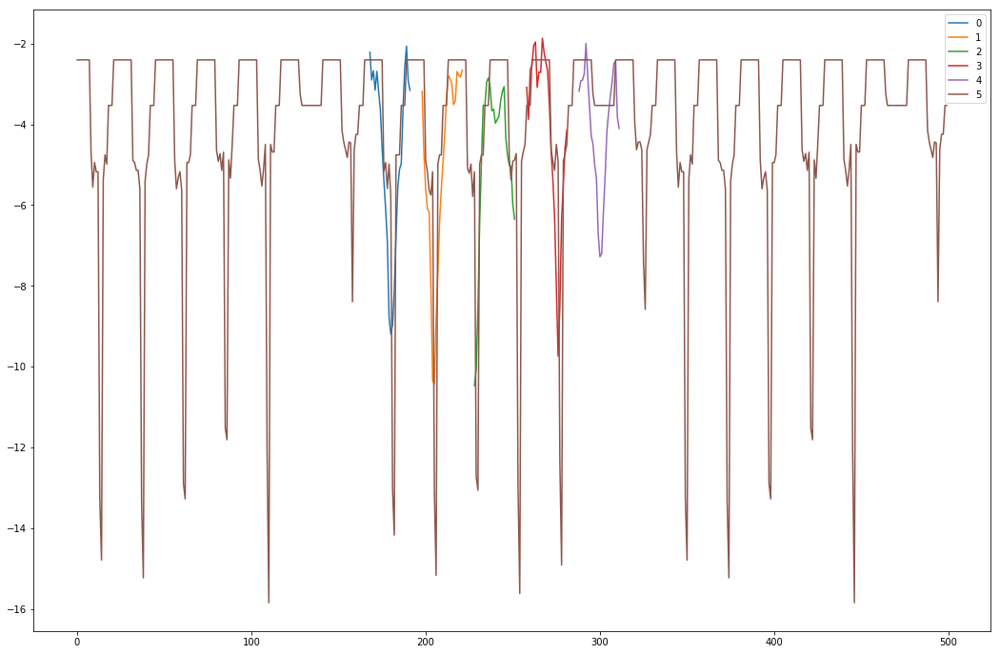

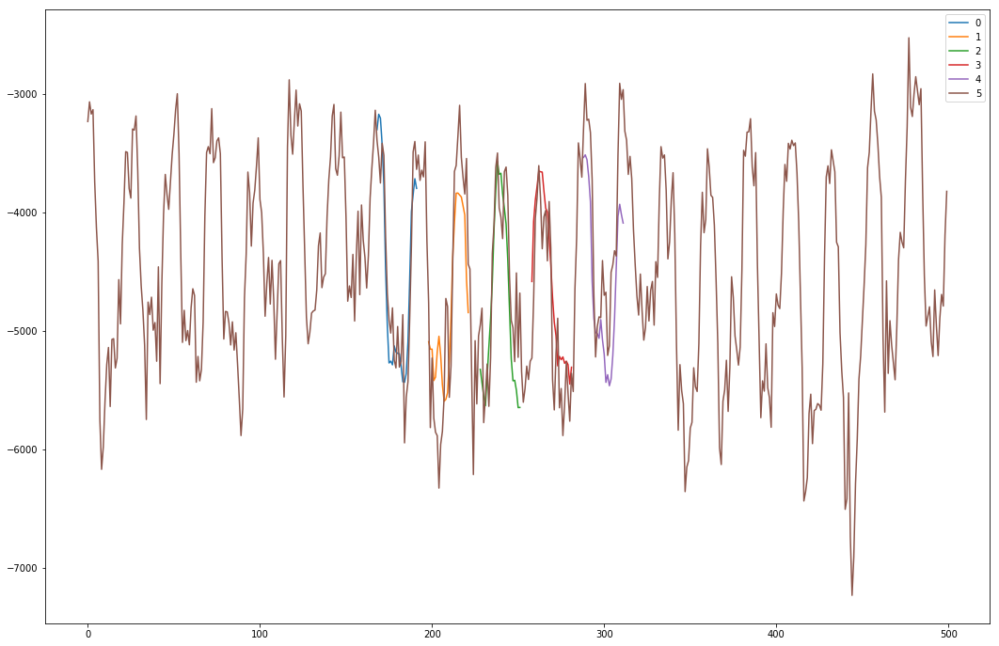

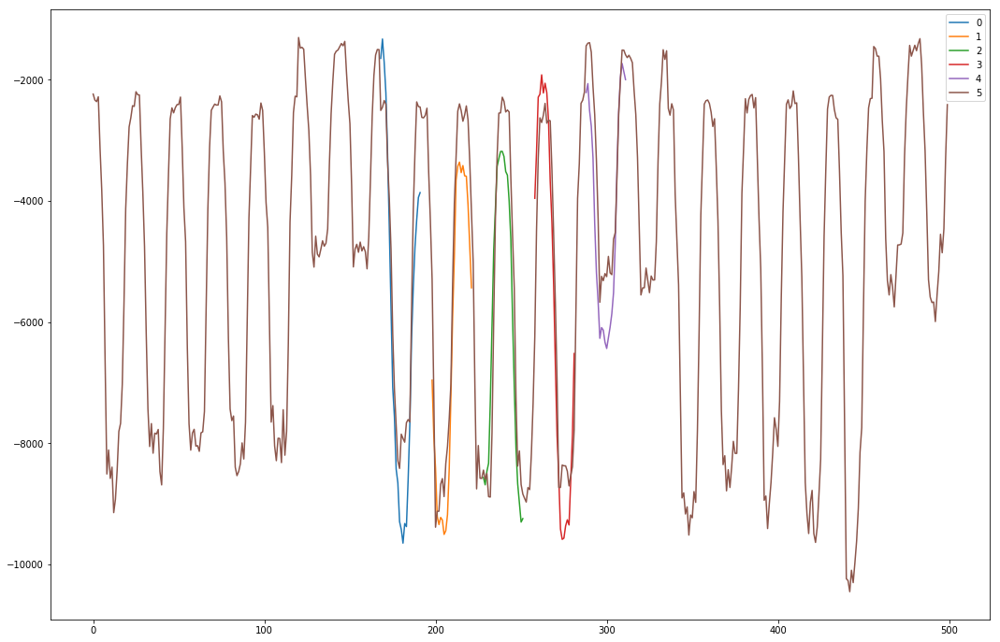

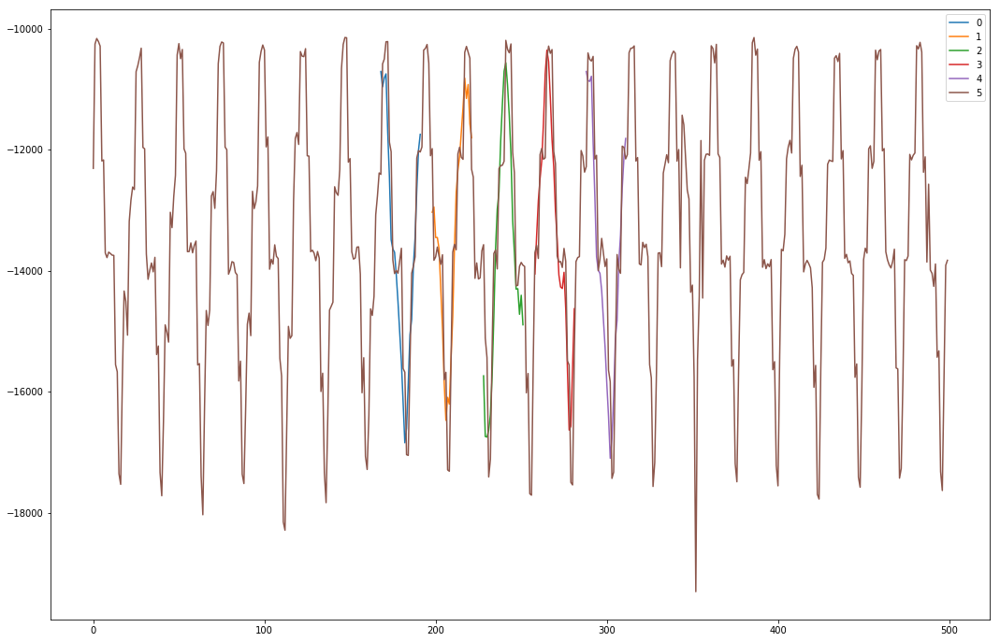

In [169]:
f = game_files[80]
clear()
d, scaler = parse_usage_game_log(f, pp_type='none')

for cu in customers:
        print(cu)
        #getting the data and scaler. this is extremely dirty, because the 
        #plot_for_model function needs these two variables to function.
        base_data = data.demand_data[cu]
        scaler = scalers[cu]
        base_data = scaler.transform(base_data.reshape(-1,1)).flatten()
        plot_for_model(model_unif, flatten=True, figsize=(18,12))

# BUJA!

HighIncome-1_10
(500, 6)
HighIncome-2_12
(500, 6)
OfficeComplex 1 SS Base
(500, 6)
Village 2 NS Base
(500, 6)
Village 2 RaS Controllable
(500, 6)
LowIncome-1_14
(500, 6)


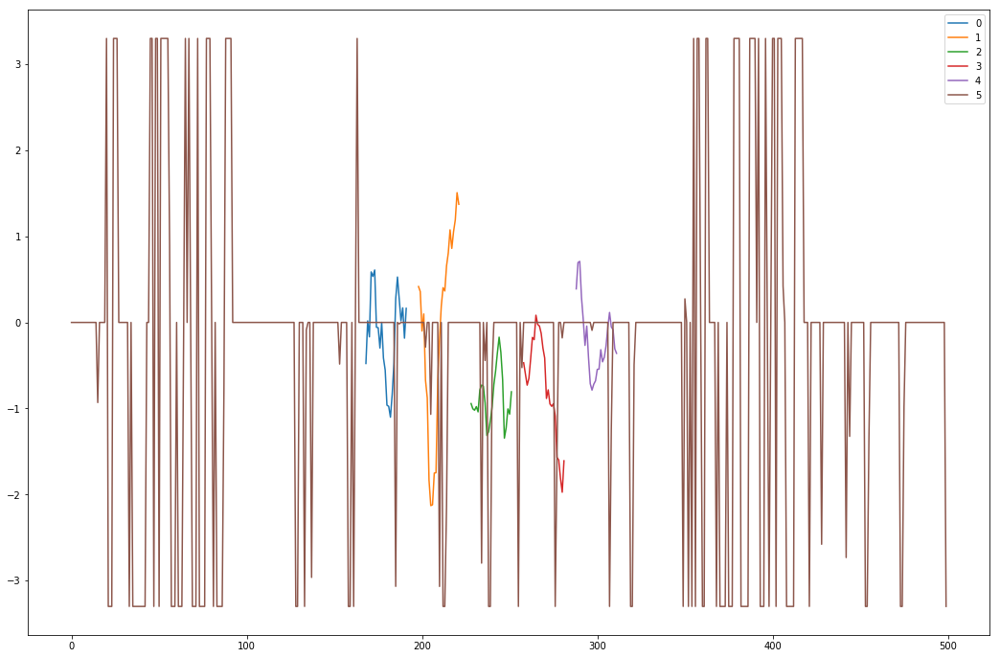

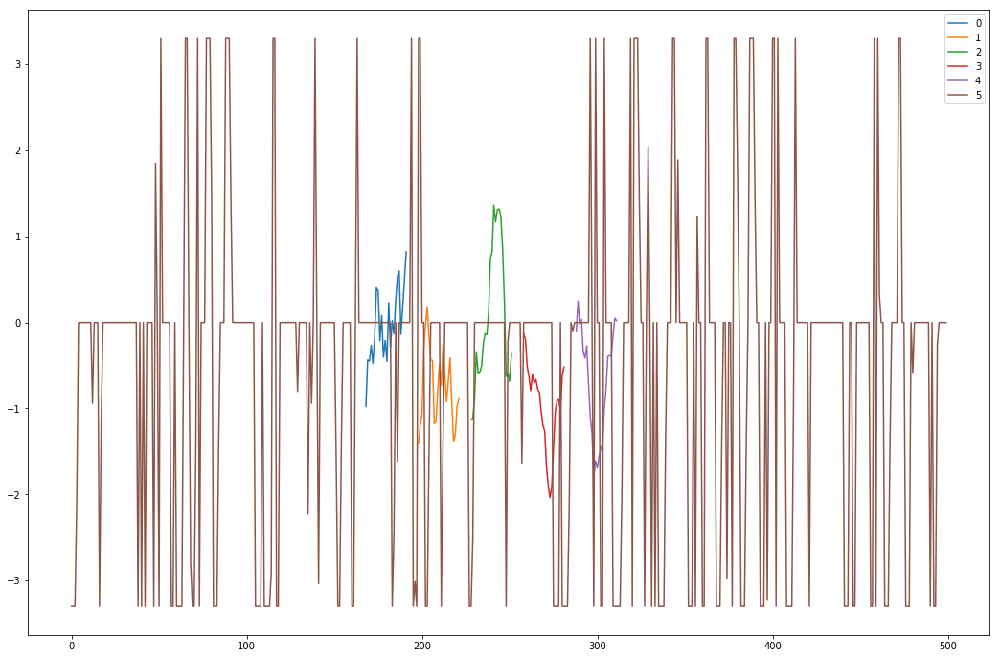

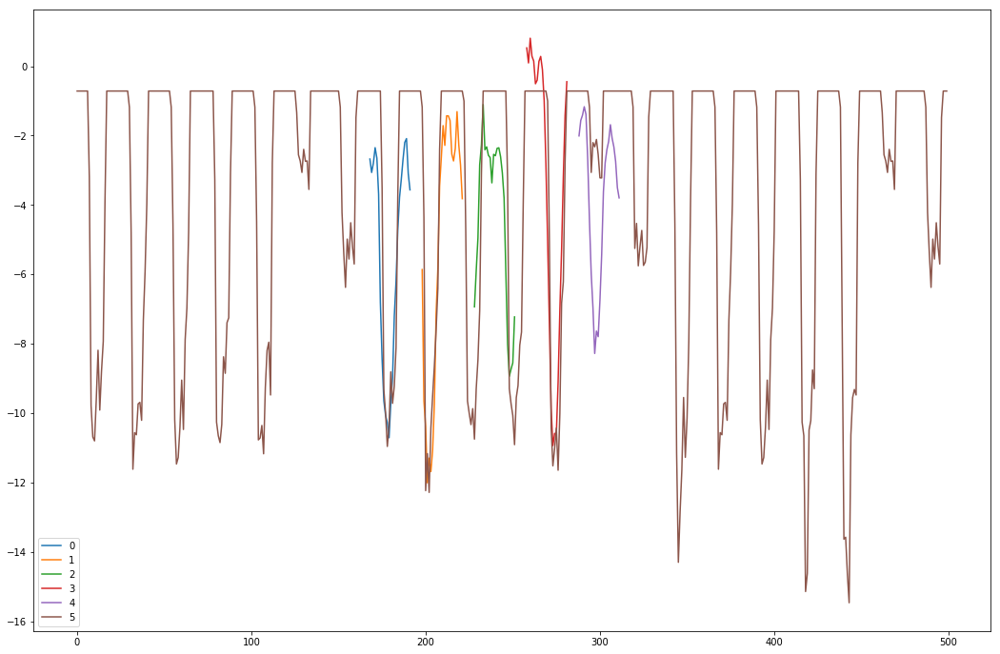

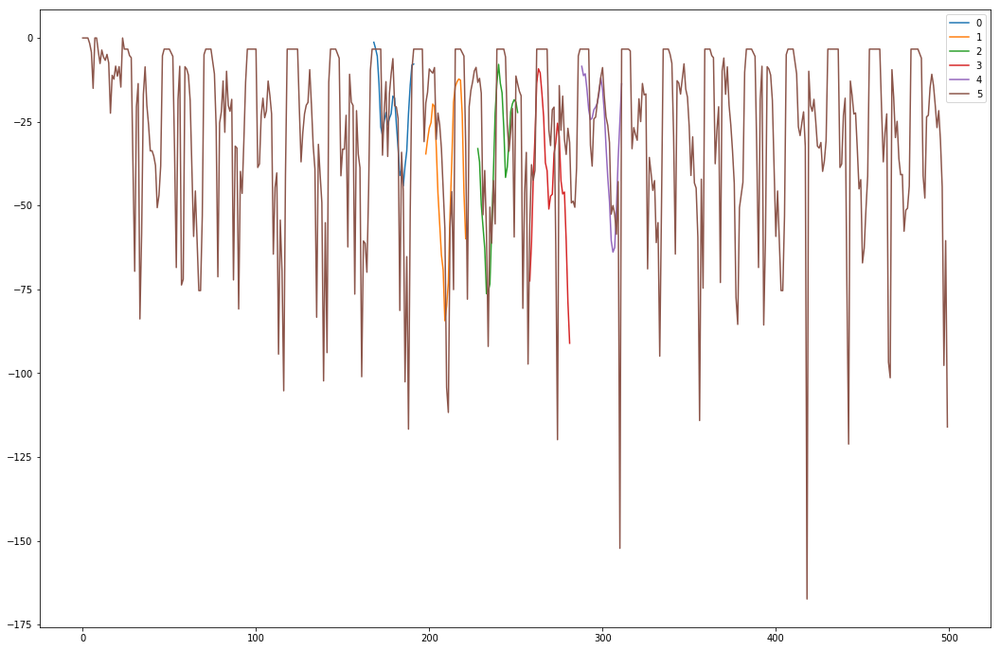

In [173]:
#okay just for fun now. different customers


customers2 = ["HighIncome-1_10", "HighIncome-2_12","OfficeComplex 1 SS Base","Village 2 NS Base","Village 2 RaS Controllable", "LowIncome-1_14"]

for cu in customers2:
        cu_data = data.demand_data[cu]
        data_inverse = cu_data.reshape(-1,1)
        scaler = MinMaxScaler()
        scaler.fit(data_inverse)
        scalers[cu] = scaler
        print(cu)
        #getting the data and scaler. this is extremely dirty, because the 
        #plot_for_model function needs these two variables to function.
        base_data = data.demand_data[cu]
        scaler = scalers[cu]
        base_data = scaler.transform(base_data.reshape(-1,1)).flatten()
        plot_for_model(model_unif, flatten=True, figsize=(18,12))